In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Load MNIST
(x_train, _), (x_test, _) = keras.datasets.mnist.load_data()
x_train = x_train.astype("float32") / 255.0
x_train = np.expand_dims(x_train, -1)

# Encoder
latent_dim = 16
encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Flatten()(encoder_inputs)
latent = layers.Dense(latent_dim)(x)

encoder = keras.Model(encoder_inputs, latent, name="encoder")

# --- Decoder ---
decoder_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(28*28, activation="sigmoid")(decoder_inputs)
outputs = layers.Reshape((28, 28, 1))(x)

decoder = keras.Model(decoder_inputs, outputs, name="decoder")

# Autoencoder (encoder + decoder)
img_inputs = keras.Input(shape=(28, 28, 1))
encoded = encoder(img_inputs)
decoded = decoder(encoded)

autoencoder = keras.Model(img_inputs, decoded, name="autoencoder")
autoencoder.compile(optimizer="adam", loss="binary_crossentropy")

# Train
autoencoder.fit(x_train, x_train, epochs=10, batch_size=256)


11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
Epoch 1/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.4055
Epoch 2/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2120
Epoch 3/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1763
Epoch 4/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1590
Epoch 5/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1497
Epoch 6/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1452
Epoch 7/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1417
Epoch 8/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1391
Epoch 9/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1372
Epoch 10/10
235/235 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1352


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step


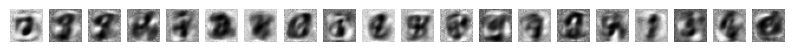

In [2]:
# Generate images

num_samples = 20
random_latent = np.random.normal(size=(num_samples, latent_dim))
generated = decoder.predict(random_latent)

# Visualize results
plt.figure(figsize=(10, 2))
for i in range(num_samples):
    plt.subplot(1, num_samples, i+1)
    plt.imshow(generated[i].squeeze(), cmap="gray")
    plt.axis("off")
plt.show()

# Convolution layers

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [ ]:
# Load MNIST
(x_train, _), (x_test, _) = keras.datasets.mnist.load_data()
x_train = x_train.astype("float32") / 255.0
x_train = np.expand_dims(x_train, -1)

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Epoch 1/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - loss: 0.3414
Epoch 2/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.1071
Epoch 3/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0869
Epoch 4/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0814
Epoch 5/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0785
Epoch 6/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0769
Epoch 7/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0757
Epoch 8/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0748
Epoch 9/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0741
Epoch 10/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0736
Epoch 11/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0733
Epoch 12/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0729
Epoch 13/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0726
Epoch 14/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0721
Epoch 15/15
235/235 ━━━━━━━━━━━━━━━━━━━━ 3

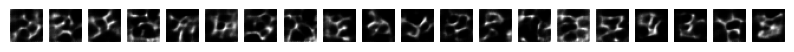

In [ ]:
# Encoder
latent_dim = 32

encoder_inputs = keras.Input(shape=(28, 28, 1))
x = layers.Conv2D(32, 3, activation="relu", padding="same")(encoder_inputs)
x = layers.MaxPool2D(2, padding="same")(x)
x = layers.Conv2D(64, 3, activation="relu", padding="same")(x)
x = layers.MaxPool2D(2, padding="same")(x)
x = layers.Flatten()(x)
latent = layers.Dense(latent_dim)(x)

encoder = keras.Model(encoder_inputs, latent, name="encoder")

# Decoder
decoder_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(7 * 7 * 64, activation="relu")(decoder_inputs)
x = layers.Reshape((7, 7, 64))(x)
x = layers.Conv2DTranspose(64, 3, strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(32, 3, strides=2, activation="relu", padding="same")(x)
decoder_outputs = layers.Conv2D(1, 3, activation="sigmoid", padding="same")(x)

decoder = keras.Model(decoder_inputs, decoder_outputs, name="decoder")

# Autoencoder
img_inputs = keras.Input(shape=(28, 28, 1))
encoded = encoder(img_inputs)
decoded = decoder(encoded)

autoencoder = keras.Model(img_inputs, decoded, name="autoencoder")
autoencoder.compile(optimizer="adam", loss="binary_crossentropy")

# Train
autoencoder.fit(x_train, x_train, epochs=15, batch_size=256)

# Generate NEW images
num_samples = 20
random_latent = np.random.normal(size=(num_samples, latent_dim))
generated = decoder.predict(random_latent)

# Visualize generated digits
plt.figure(figsize=(10, 2))
for i in range(num_samples):
    plt.subplot(1, num_samples, i + 1)
    plt.imshow(generated[i].squeeze(), cmap="gray")
    plt.axis("off")
plt.show()


# Deep Convolutional Generative Adversarial Network (DCGAN)

Epoch 1/30   Gen Loss: 1.2909   Disc Loss: 0.9023


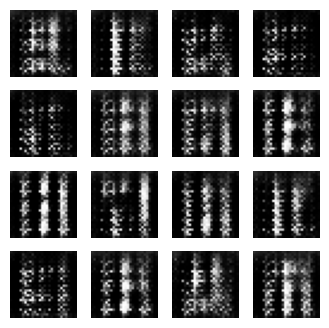

Epoch 2/30   Gen Loss: 0.7964   Disc Loss: 1.2222


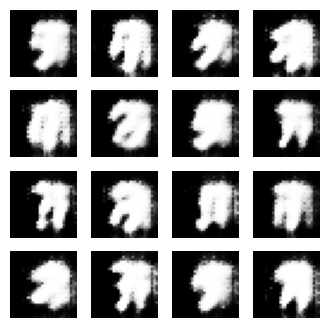

Epoch 3/30   Gen Loss: 0.7751   Disc Loss: 1.3560


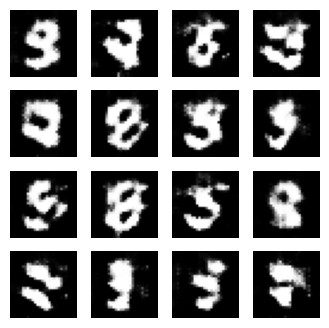

Epoch 4/30   Gen Loss: 0.9761   Disc Loss: 1.0660


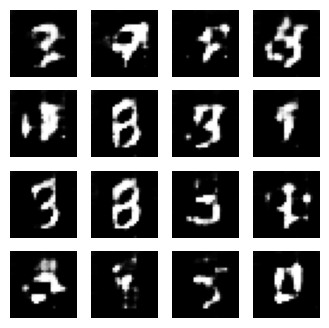

Epoch 5/30   Gen Loss: 1.0721   Disc Loss: 1.0196


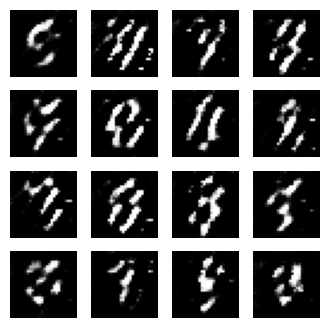

Epoch 6/30   Gen Loss: 0.8351   Disc Loss: 1.3044


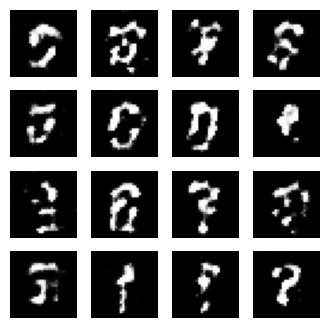

Epoch 7/30   Gen Loss: 1.1130   Disc Loss: 1.1410


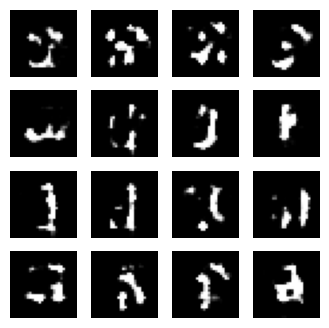

Epoch 8/30   Gen Loss: 1.0117   Disc Loss: 1.2352


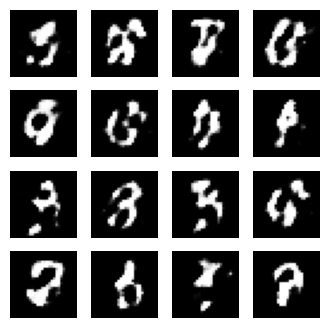

Epoch 9/30   Gen Loss: 1.0619   Disc Loss: 1.0961


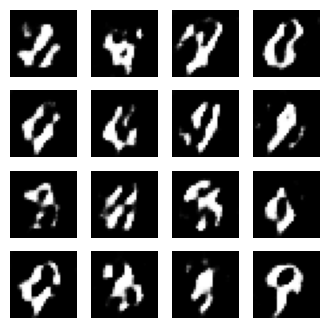

Epoch 10/30   Gen Loss: 1.2173   Disc Loss: 1.1441


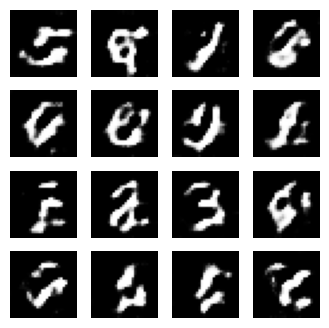

Epoch 11/30   Gen Loss: 1.3296   Disc Loss: 1.2132


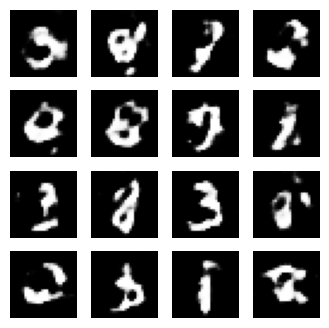

Epoch 12/30   Gen Loss: 0.9880   Disc Loss: 1.3136


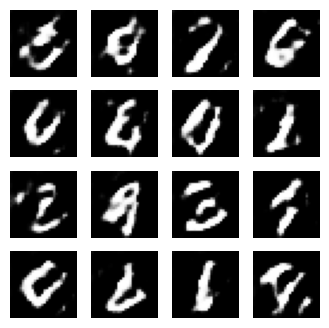

Epoch 13/30   Gen Loss: 1.5329   Disc Loss: 0.9236


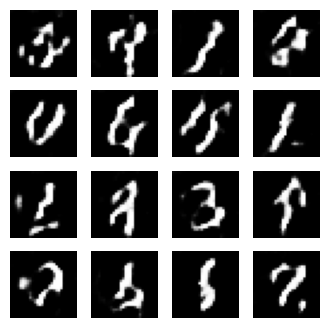

Epoch 14/30   Gen Loss: 1.2873   Disc Loss: 0.9085


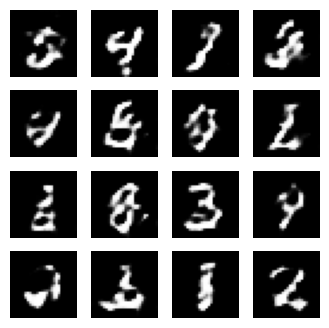

Epoch 15/30   Gen Loss: 0.9445   Disc Loss: 1.2124


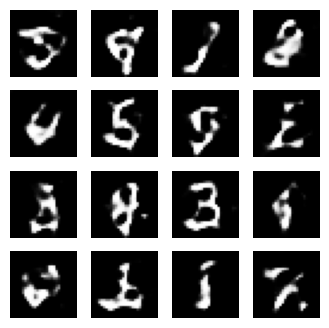

Epoch 16/30   Gen Loss: 1.1008   Disc Loss: 0.9271


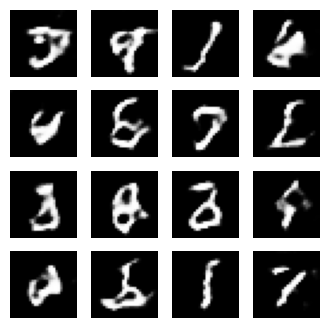

Epoch 17/30   Gen Loss: 1.3487   Disc Loss: 1.1716


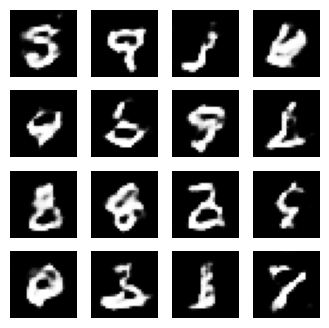

Epoch 18/30   Gen Loss: 1.0985   Disc Loss: 1.1514


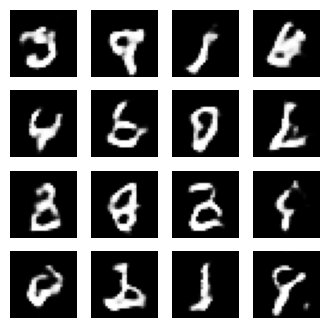

Epoch 19/30   Gen Loss: 0.9509   Disc Loss: 1.2064


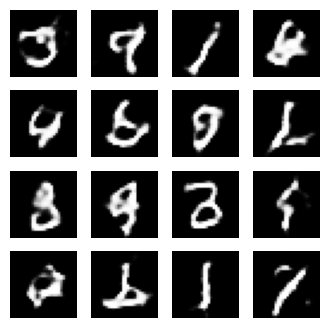

Epoch 20/30   Gen Loss: 0.9688   Disc Loss: 1.0734


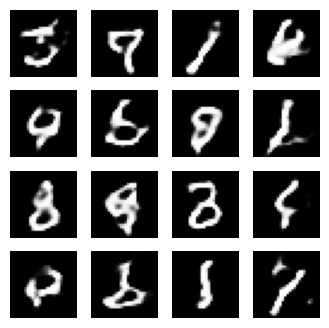

Epoch 21/30   Gen Loss: 0.9364   Disc Loss: 1.1899


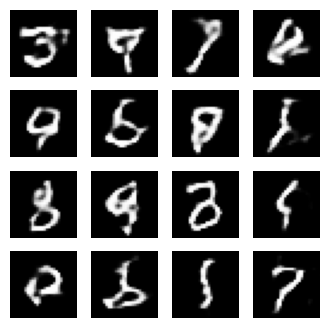

Epoch 22/30   Gen Loss: 1.2307   Disc Loss: 1.0540


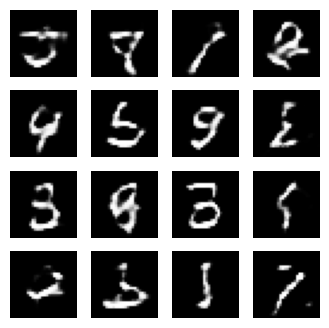

Epoch 23/30   Gen Loss: 0.9766   Disc Loss: 1.1370


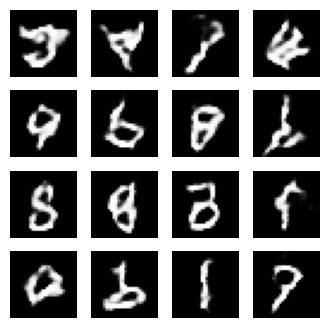

Epoch 24/30   Gen Loss: 1.0278   Disc Loss: 1.1703


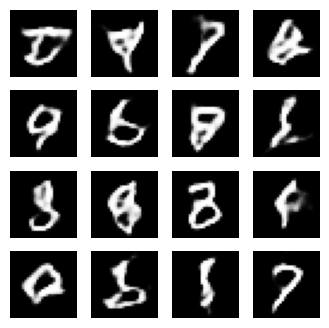

Epoch 25/30   Gen Loss: 0.8121   Disc Loss: 1.3309


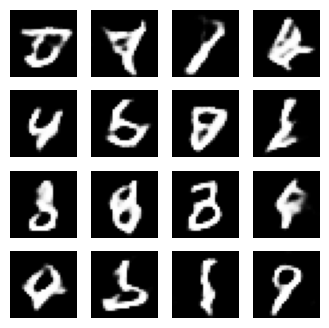

Epoch 26/30   Gen Loss: 0.8533   Disc Loss: 1.2267


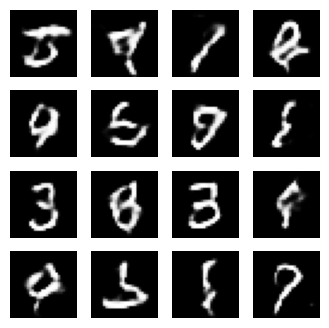

Epoch 27/30   Gen Loss: 0.9496   Disc Loss: 1.1917


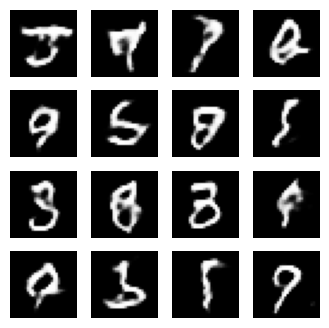

Epoch 28/30   Gen Loss: 0.7981   Disc Loss: 1.3102


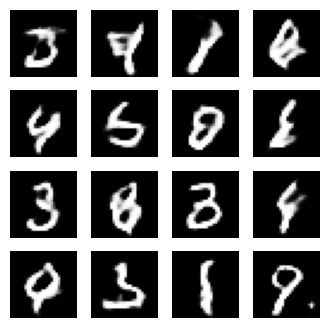

Epoch 29/30   Gen Loss: 1.0749   Disc Loss: 1.0582


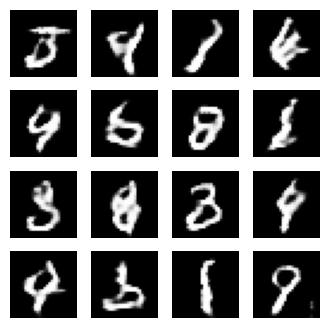

Epoch 30/30   Gen Loss: 1.0281   Disc Loss: 1.2172


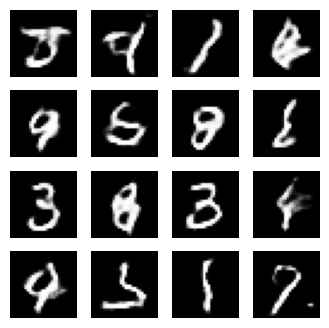

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np


# Load and preprocess MNIST
(x_train, _), (_, _) = tf.keras.datasets.mnist.load_data()
x_train = (x_train - 127.5) / 127.5     # scale to [-1, 1]
x_train = np.expand_dims(x_train, axis=3)  # (60000, 28,28,1)
BUFFER_SIZE = 60000
BATCH_SIZE = 128

dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


# ------------------------------
# Build the Generator

def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(7*7*256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Reshape((7, 7, 256)),

        layers.Conv2DTranspose(128, (5,5), strides=(1,1), padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(1, (5,5), strides=(2,2), padding="same", use_bias=False, activation="tanh"),
    ])
    return model

generator = build_generator()


# ------------------------------
# Build the Discriminator

def build_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5,5), strides=(2,2), padding="same", input_shape=[28,28,1]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5,5), strides=(2,2), padding="same"),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1),
    ])
    return model

discriminator = build_discriminator()

# Losses and optimizers
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_opt = tf.keras.optimizers.Adam(1e-4)
discriminator_opt = tf.keras.optimizers.Adam(1e-4)

# ------------------------------
# Training Step

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    # Train discriminator
    with tf.GradientTape() as disc_tape:
        fake_imgs = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(fake_imgs, training=True)

        loss_real = cross_entropy(tf.ones_like(real_output), real_output)
        loss_fake = cross_entropy(tf.zeros_like(fake_output), fake_output)
        disc_loss = loss_real + loss_fake

    grads_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    discriminator_opt.apply_gradients(zip(grads_disc, discriminator.trainable_variables))

    # Train generator
    with tf.GradientTape() as gen_tape:
        fake_imgs = generator(noise, training=True)
        output = discriminator(fake_imgs, training=True)
        gen_loss = cross_entropy(tf.ones_like(output), output)

    grads_gen = gen_tape.gradient(gen_loss, generator.trainable_variables)
    generator_opt.apply_gradients(zip(grads_gen, generator.trainable_variables))

    return gen_loss, disc_loss


# ------------------------------
# Training Loop

def train(epochs=30):
    fixed_noise = tf.random.normal([16, 100])

    for epoch in range(epochs):
        for img_batch in dataset:
            gen_loss, disc_loss = train_step(img_batch)

        # Show sample results
        print(f"Epoch {epoch+1}/{epochs}   Gen Loss: {gen_loss:.4f}   Disc Loss: {disc_loss:.4f}")

        fake_imgs = generator(fixed_noise, training=False)
        fake_imgs = (fake_imgs + 1) / 2.0

        plt.figure(figsize=(4,4))
        for i in range(16):
            plt.subplot(4,4,i+1)
            plt.imshow(fake_imgs[i,:,:,0], cmap='gray')
            plt.axis('off')
        plt.show()

# ------------------------------
# RUN TRAINING
train(epochs=30)


# # Increase in the number of Epochs (100)

In [2]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np

In [3]:
(x_train, _), (_, _) = tf.keras.datasets.mnist.load_data()
x_train = (x_train - 127.5) / 127.5
x_train = np.expand_dims(x_train, axis=3)

BUFFER_SIZE = 60000
BATCH_SIZE = 128

dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [4]:
# Build the Generator

def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(7*7*256, use_bias=False, input_shape=(100,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Reshape((7, 7, 256)),

        layers.Conv2DTranspose(128, (5,5), strides=(1,1), padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(64, (5,5), strides=(2,2), padding="same", use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(),

        layers.Conv2DTranspose(1, (5,5), strides=(2,2), padding="same", use_bias=False, activation="tanh"),
    ])
    return model

generator = build_generator()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [5]:
# Build the Discriminator

def build_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, (5,5), strides=(2,2), padding="same", input_shape=[28,28,1]),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Conv2D(128, (5,5), strides=(2,2), padding="same"),
        layers.LeakyReLU(),
        layers.Dropout(0.3),

        layers.Flatten(),
        layers.Dense(1),
    ])
    return model

discriminator = build_discriminator()

# Losses and optimizers
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_opt = tf.keras.optimizers.Adam(1e-4)
discriminator_opt = tf.keras.optimizers.Adam(1e-4)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [6]:
# Training Step

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    # Train discriminator
    with tf.GradientTape() as disc_tape:
        fake_imgs = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(fake_imgs, training=True)

        loss_real = cross_entropy(tf.ones_like(real_output), real_output)
        loss_fake = cross_entropy(tf.zeros_like(fake_output), fake_output)
        disc_loss = loss_real + loss_fake

    grads_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    discriminator_opt.apply_gradients(zip(grads_disc, discriminator.trainable_variables))

    # Train generator
    with tf.GradientTape() as gen_tape:
        fake_imgs = generator(noise, training=True)
        output = discriminator(fake_imgs, training=True)
        gen_loss = cross_entropy(tf.ones_like(output), output)

    grads_gen = gen_tape.gradient(gen_loss, generator.trainable_variables)
    generator_opt.apply_gradients(zip(grads_gen, generator.trainable_variables))

    return gen_loss, disc_loss

Epoch 1/100   Gen Loss: 1.5597   Disc Loss: 0.6473


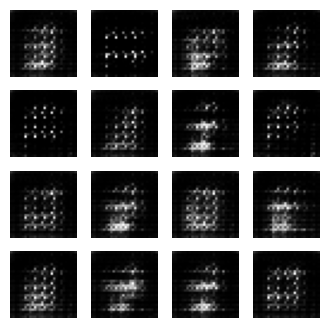

Epoch 2/100   Gen Loss: 0.9370   Disc Loss: 1.2503


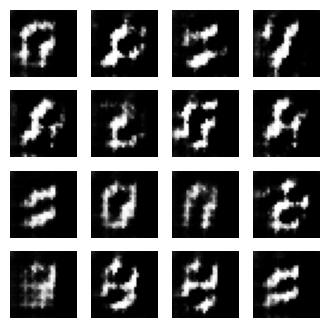

Epoch 3/100   Gen Loss: 0.9880   Disc Loss: 1.1795


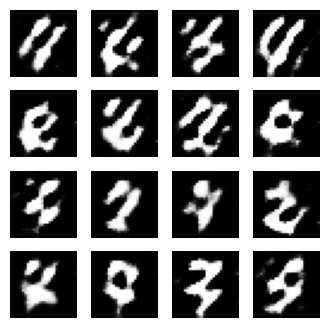

Epoch 4/100   Gen Loss: 0.8036   Disc Loss: 1.2959


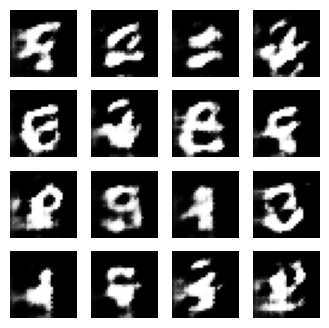

Epoch 5/100   Gen Loss: 0.9995   Disc Loss: 1.0583


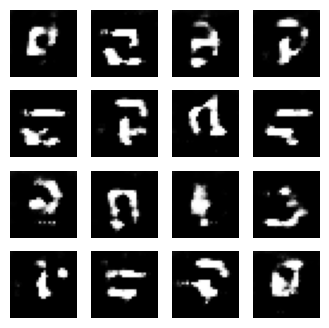

Epoch 6/100   Gen Loss: 1.1348   Disc Loss: 0.9832


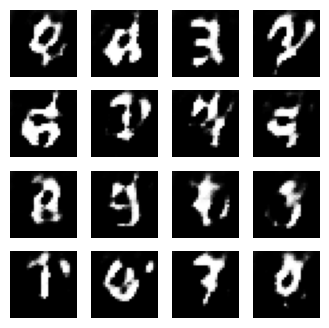

Epoch 7/100   Gen Loss: 0.9282   Disc Loss: 1.2517


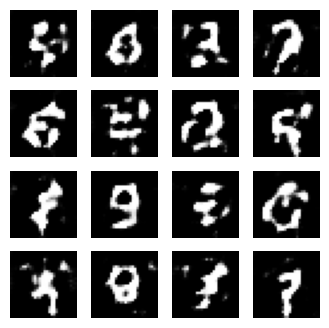

Epoch 8/100   Gen Loss: 1.2231   Disc Loss: 1.0763


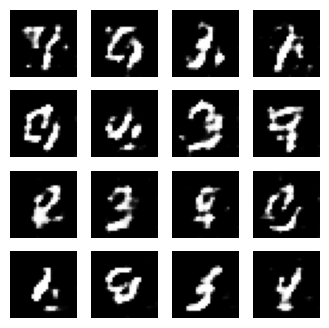

Epoch 9/100   Gen Loss: 1.4050   Disc Loss: 0.9537


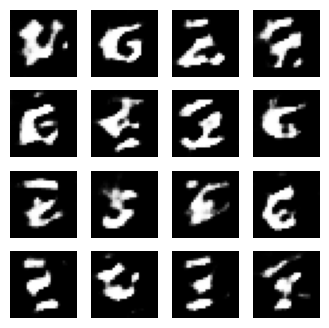

Epoch 10/100   Gen Loss: 1.2731   Disc Loss: 0.9591


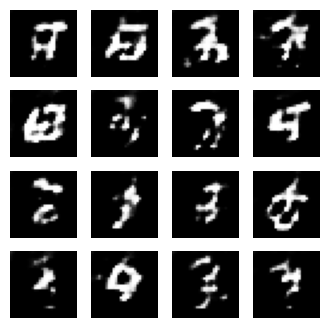

Epoch 11/100   Gen Loss: 1.0751   Disc Loss: 1.3317


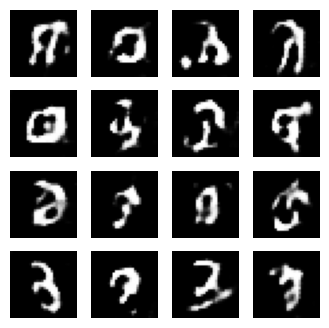

Epoch 12/100   Gen Loss: 1.0997   Disc Loss: 1.1934


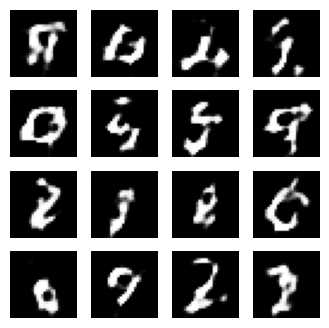

Epoch 13/100   Gen Loss: 1.1249   Disc Loss: 1.0808


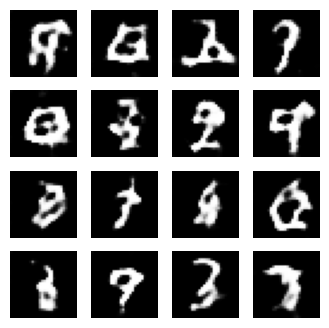

Epoch 14/100   Gen Loss: 1.1286   Disc Loss: 1.2661


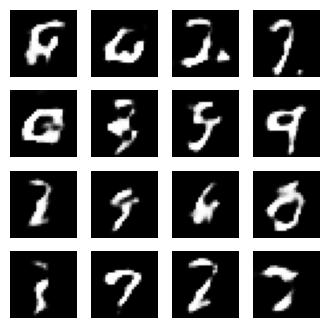

Epoch 15/100   Gen Loss: 1.1797   Disc Loss: 1.0364


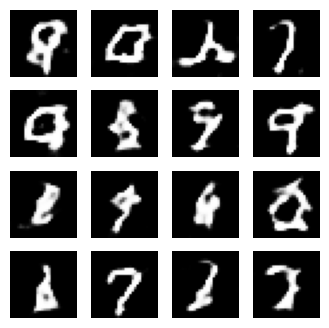

Epoch 16/100   Gen Loss: 0.9219   Disc Loss: 1.2573


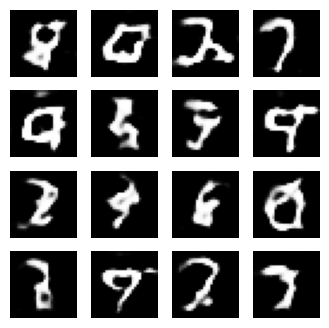

Epoch 17/100   Gen Loss: 1.1345   Disc Loss: 1.1524


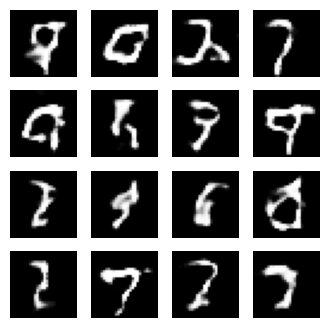

Epoch 18/100   Gen Loss: 1.0160   Disc Loss: 1.1080


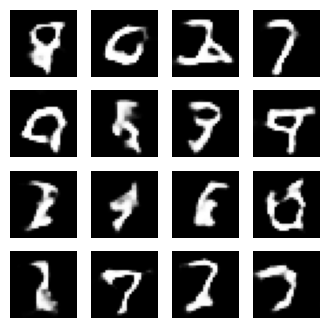

Epoch 19/100   Gen Loss: 1.0800   Disc Loss: 1.3518


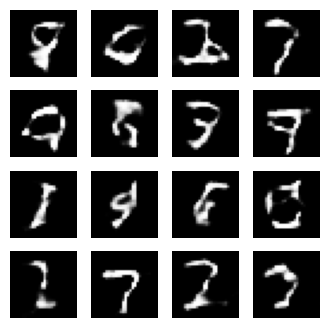

Epoch 20/100   Gen Loss: 0.8313   Disc Loss: 1.3912


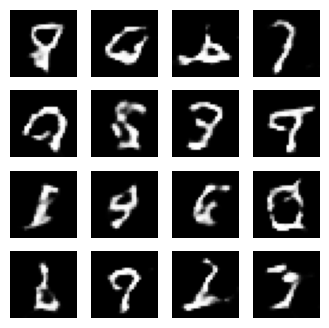

Epoch 21/100   Gen Loss: 0.9159   Disc Loss: 1.2712


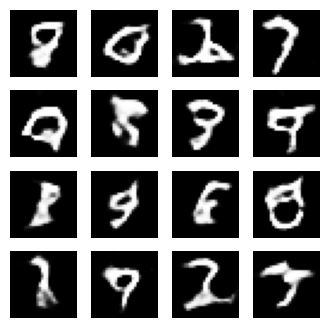

Epoch 22/100   Gen Loss: 0.8546   Disc Loss: 1.2884


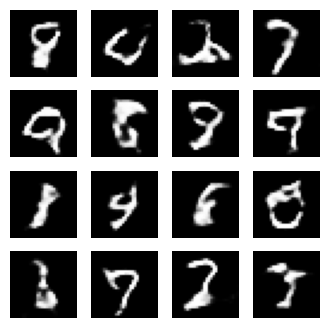

Epoch 23/100   Gen Loss: 1.0784   Disc Loss: 1.1826


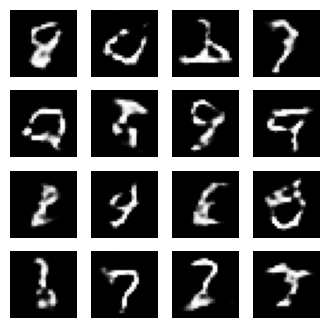

Epoch 24/100   Gen Loss: 0.9662   Disc Loss: 1.2298


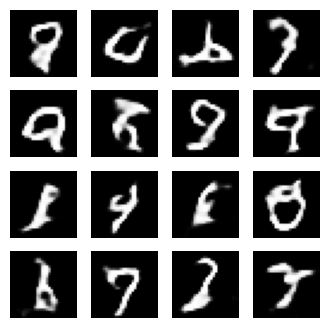

Epoch 25/100   Gen Loss: 0.9166   Disc Loss: 1.2677


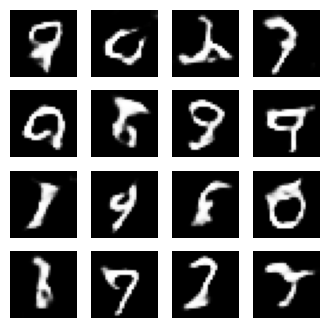

Epoch 26/100   Gen Loss: 0.8374   Disc Loss: 1.2952


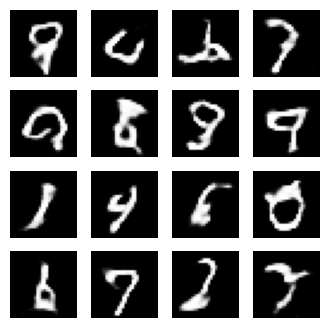

Epoch 27/100   Gen Loss: 1.0965   Disc Loss: 1.1000


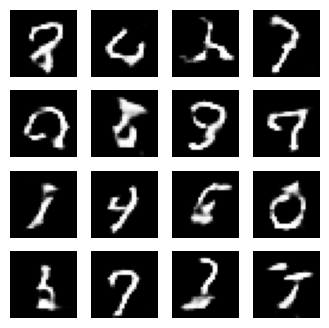

Epoch 28/100   Gen Loss: 0.8168   Disc Loss: 1.3144


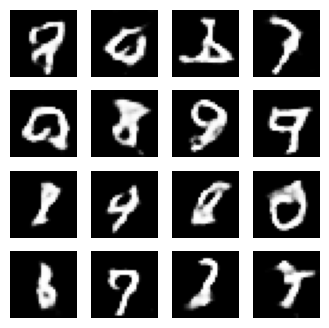

Epoch 29/100   Gen Loss: 0.8787   Disc Loss: 1.2241


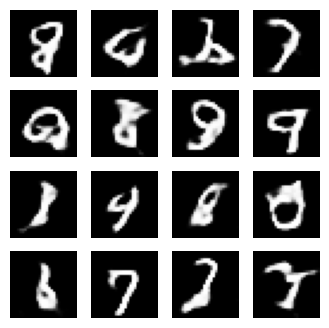

Epoch 30/100   Gen Loss: 1.0045   Disc Loss: 1.1586


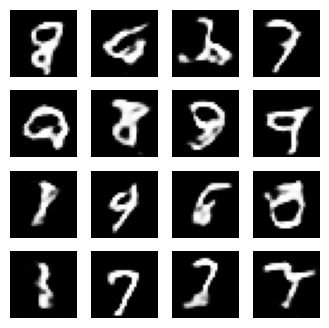

Epoch 31/100   Gen Loss: 1.0259   Disc Loss: 1.1162


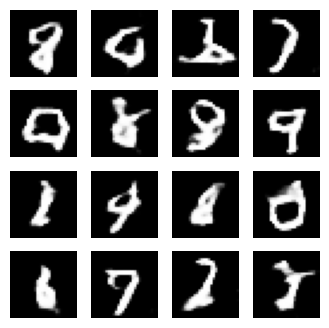

Epoch 32/100   Gen Loss: 0.8347   Disc Loss: 1.1766


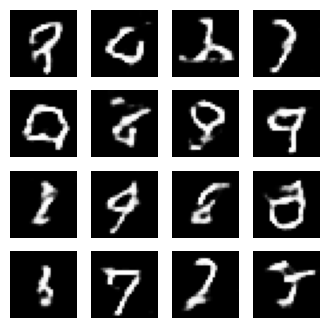

Epoch 33/100   Gen Loss: 0.9217   Disc Loss: 1.1810


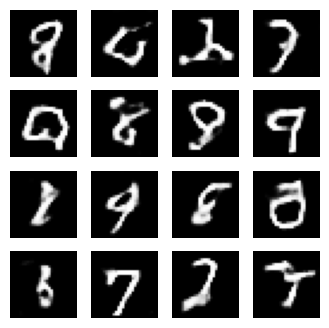

Epoch 34/100   Gen Loss: 0.8531   Disc Loss: 1.2632


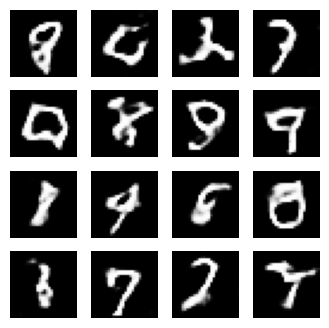

Epoch 35/100   Gen Loss: 0.8918   Disc Loss: 1.3247


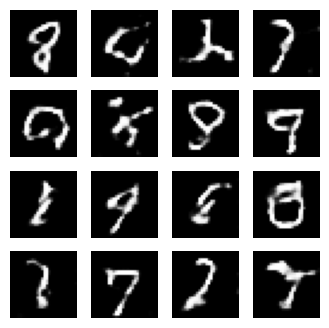

Epoch 36/100   Gen Loss: 0.8616   Disc Loss: 1.3154


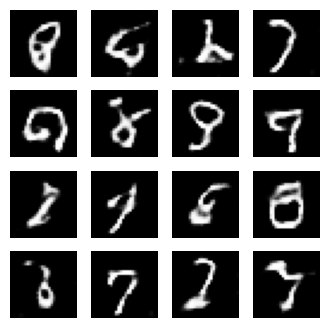

Epoch 37/100   Gen Loss: 1.0275   Disc Loss: 1.1227


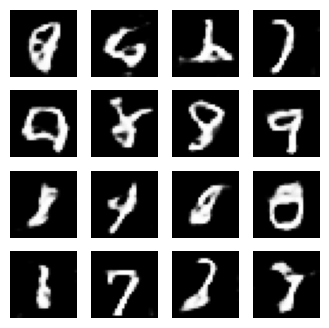

Epoch 38/100   Gen Loss: 1.0005   Disc Loss: 1.1567


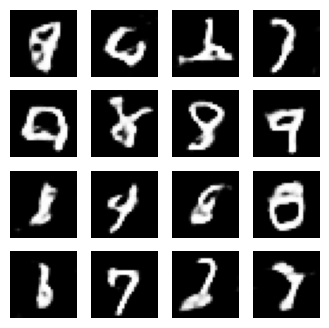

Epoch 39/100   Gen Loss: 0.7987   Disc Loss: 1.2727


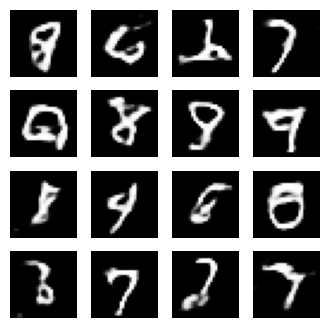

Epoch 40/100   Gen Loss: 0.8063   Disc Loss: 1.2768


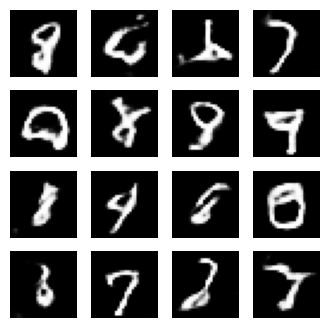

Epoch 41/100   Gen Loss: 1.1005   Disc Loss: 1.1378


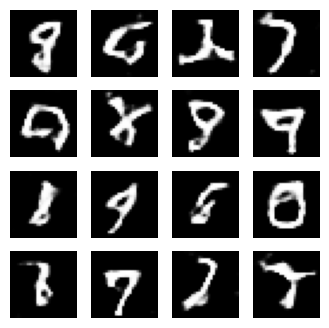

Epoch 42/100   Gen Loss: 0.9368   Disc Loss: 1.4081


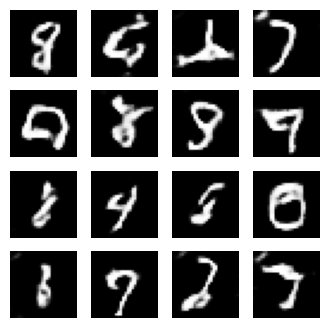

Epoch 43/100   Gen Loss: 0.9989   Disc Loss: 1.3078


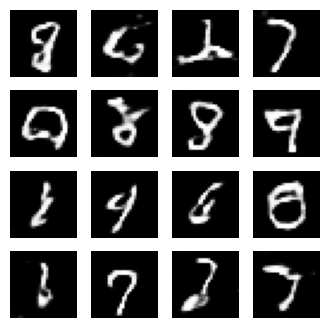

Epoch 44/100   Gen Loss: 1.0584   Disc Loss: 1.2991


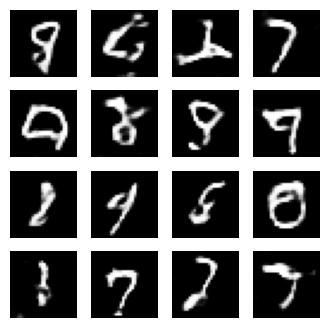

Epoch 45/100   Gen Loss: 1.0245   Disc Loss: 1.3370


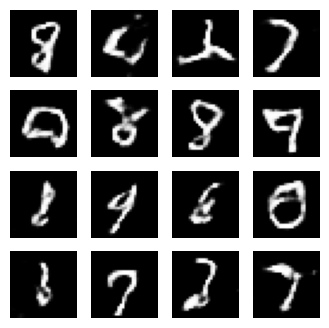

Epoch 46/100   Gen Loss: 1.0073   Disc Loss: 1.2914


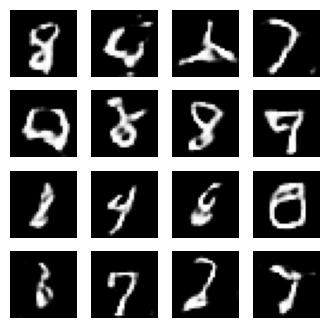

Epoch 47/100   Gen Loss: 0.9196   Disc Loss: 1.2813


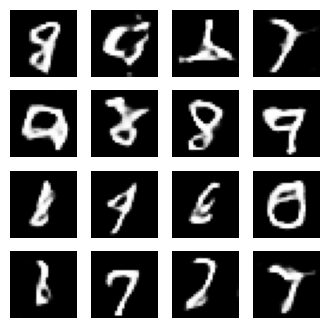

Epoch 48/100   Gen Loss: 0.8438   Disc Loss: 1.3534


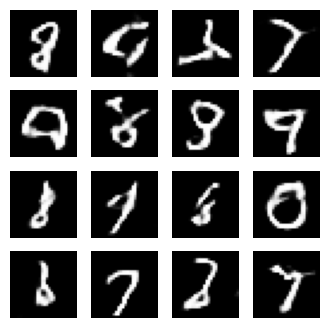

Epoch 49/100   Gen Loss: 0.7491   Disc Loss: 1.2360


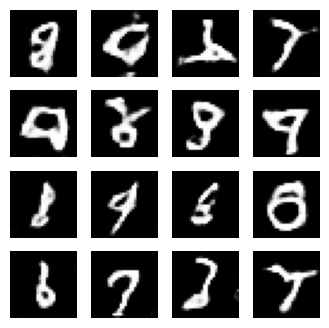

Epoch 50/100   Gen Loss: 0.9993   Disc Loss: 1.1085


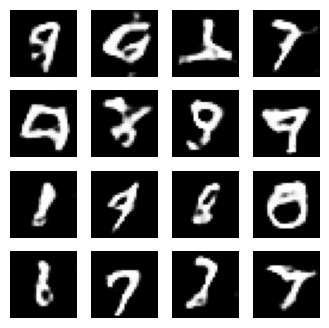

Epoch 51/100   Gen Loss: 0.8901   Disc Loss: 1.2352


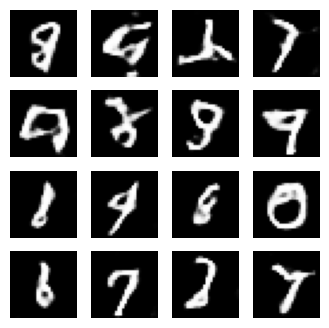

Epoch 52/100   Gen Loss: 0.8674   Disc Loss: 1.2541


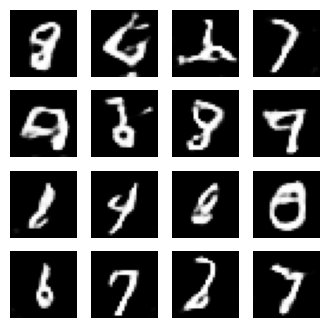

Epoch 53/100   Gen Loss: 1.0319   Disc Loss: 1.2956


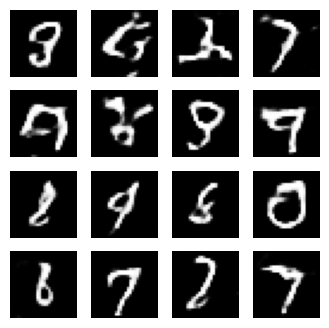

Epoch 54/100   Gen Loss: 0.8468   Disc Loss: 1.3215


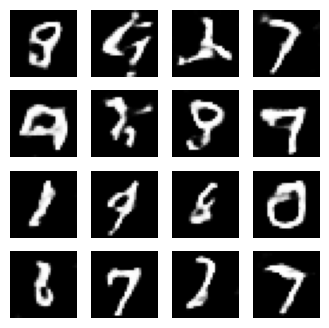

Epoch 55/100   Gen Loss: 0.9837   Disc Loss: 1.2523


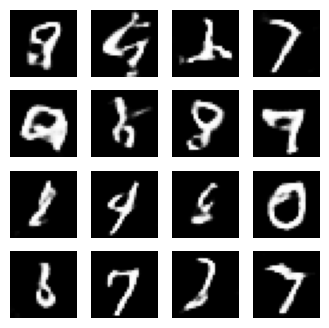

Epoch 56/100   Gen Loss: 0.9328   Disc Loss: 1.2378


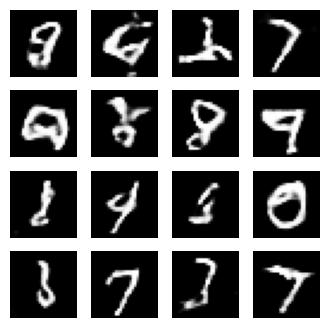

Epoch 57/100   Gen Loss: 0.8722   Disc Loss: 1.2717


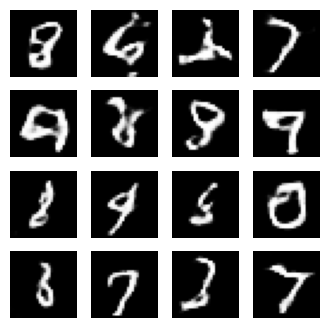

Epoch 58/100   Gen Loss: 0.8155   Disc Loss: 1.3995


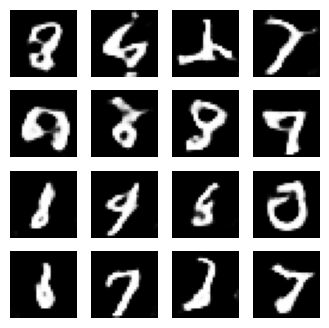

Epoch 59/100   Gen Loss: 0.9989   Disc Loss: 1.1453


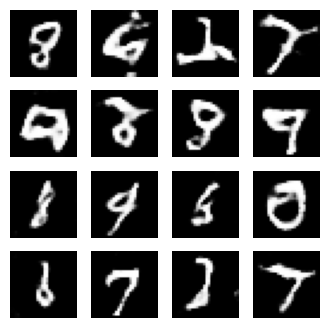

Epoch 60/100   Gen Loss: 1.0417   Disc Loss: 1.1152


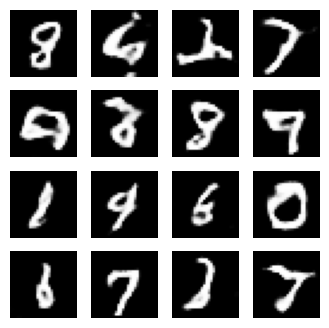

Epoch 61/100   Gen Loss: 0.8902   Disc Loss: 1.2107


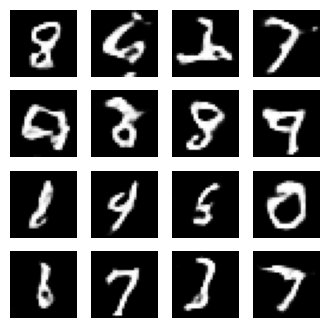

Epoch 62/100   Gen Loss: 0.9198   Disc Loss: 1.1700


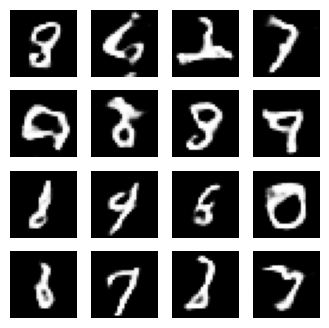

Epoch 63/100   Gen Loss: 0.9824   Disc Loss: 1.2773


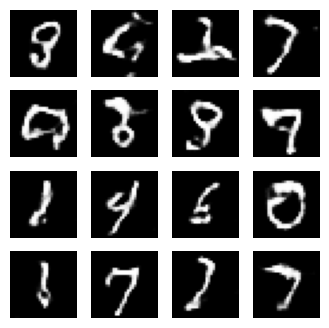

Epoch 64/100   Gen Loss: 0.8482   Disc Loss: 1.3000


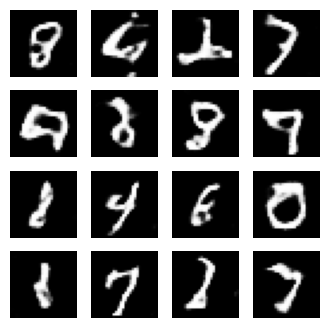

Epoch 65/100   Gen Loss: 0.9518   Disc Loss: 1.2680


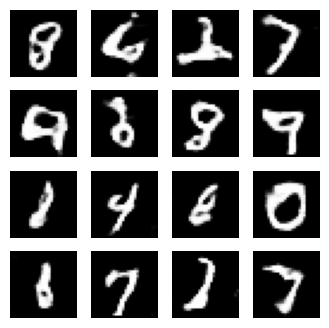

Epoch 66/100   Gen Loss: 0.8698   Disc Loss: 1.2534


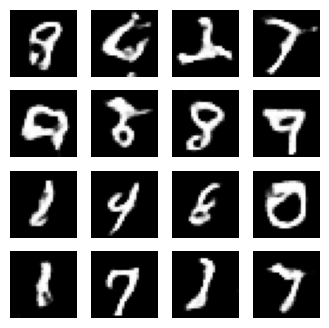

Epoch 67/100   Gen Loss: 0.8668   Disc Loss: 1.2625


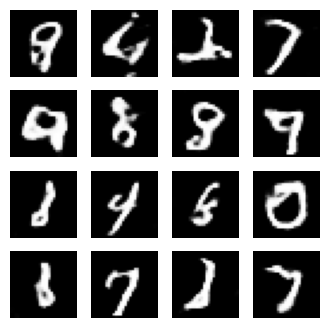

Epoch 68/100   Gen Loss: 0.9404   Disc Loss: 1.2838


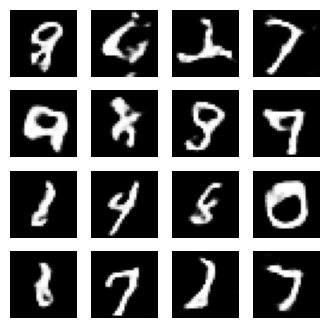

Epoch 69/100   Gen Loss: 0.8671   Disc Loss: 1.2398


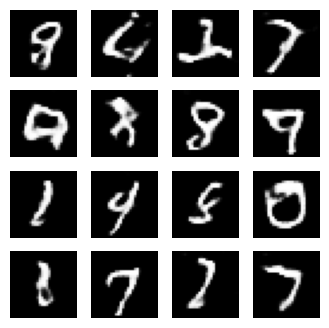

Epoch 70/100   Gen Loss: 0.8260   Disc Loss: 1.3136


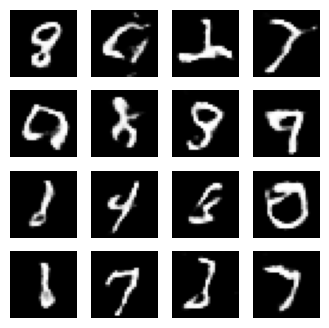

Epoch 71/100   Gen Loss: 0.9918   Disc Loss: 1.1598


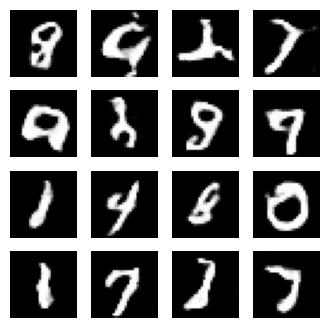

Epoch 72/100   Gen Loss: 0.9296   Disc Loss: 1.2093


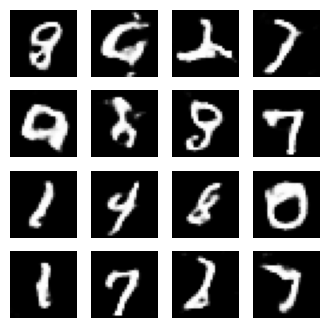

Epoch 73/100   Gen Loss: 0.8250   Disc Loss: 1.2541


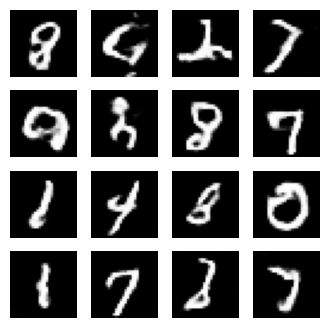

Epoch 74/100   Gen Loss: 0.8262   Disc Loss: 1.1878


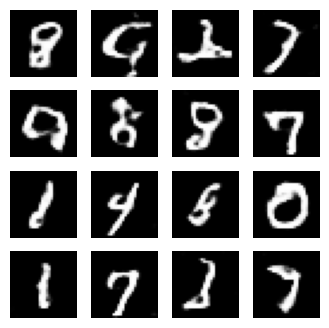

Epoch 75/100   Gen Loss: 0.8556   Disc Loss: 1.2765


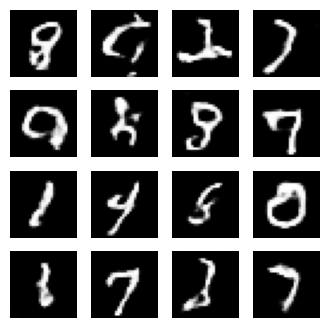

Epoch 76/100   Gen Loss: 0.8657   Disc Loss: 1.2839


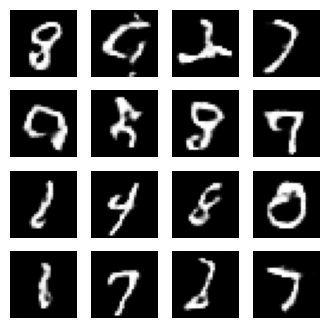

Epoch 77/100   Gen Loss: 1.1673   Disc Loss: 1.1123


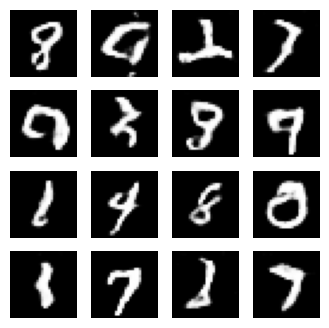

Epoch 78/100   Gen Loss: 0.9336   Disc Loss: 1.1065


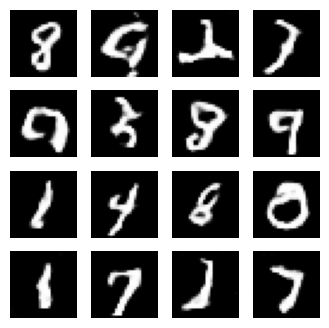

Epoch 79/100   Gen Loss: 0.8973   Disc Loss: 1.2895


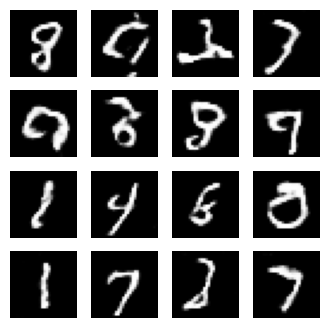

Epoch 80/100   Gen Loss: 0.8736   Disc Loss: 1.3303


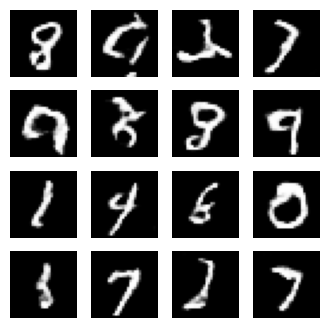

Epoch 81/100   Gen Loss: 0.7962   Disc Loss: 1.3690


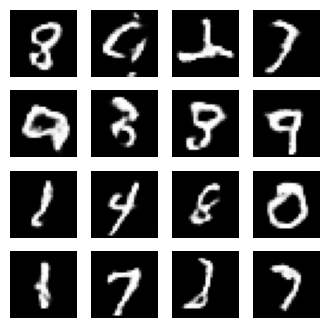

Epoch 82/100   Gen Loss: 0.7902   Disc Loss: 1.3054


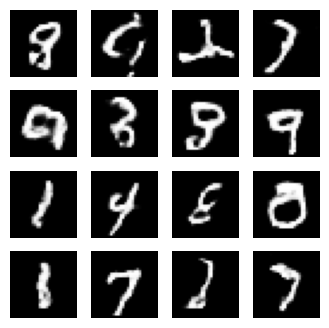

Epoch 83/100   Gen Loss: 0.7808   Disc Loss: 1.2637


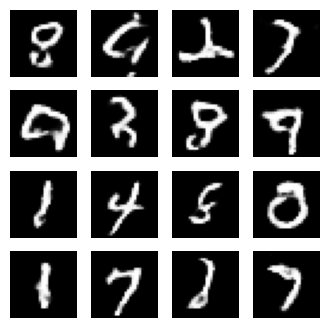

Epoch 84/100   Gen Loss: 0.9394   Disc Loss: 1.2092


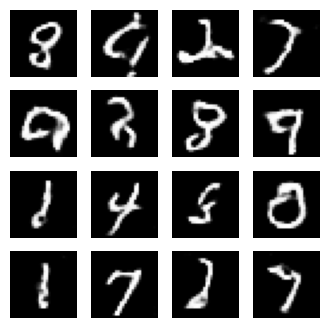

Epoch 85/100   Gen Loss: 0.8565   Disc Loss: 1.2788


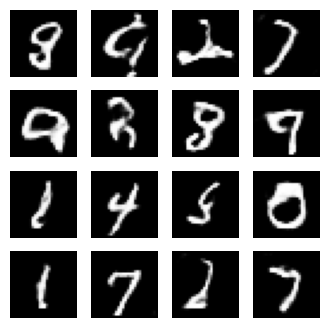

Epoch 86/100   Gen Loss: 0.8596   Disc Loss: 1.2773


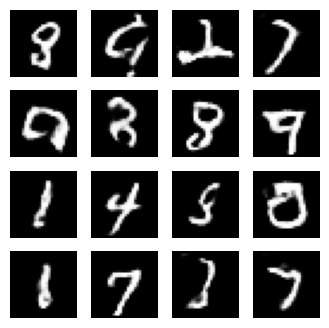

Epoch 87/100   Gen Loss: 0.8993   Disc Loss: 1.2745


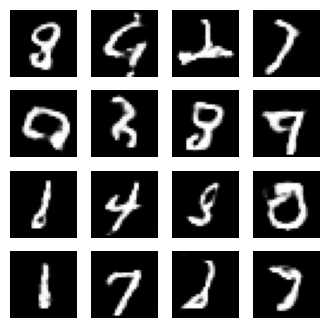

Epoch 88/100   Gen Loss: 1.0346   Disc Loss: 1.1520


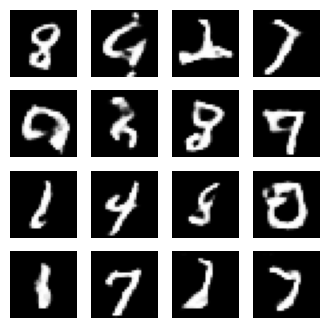

Epoch 89/100   Gen Loss: 0.8063   Disc Loss: 1.4275


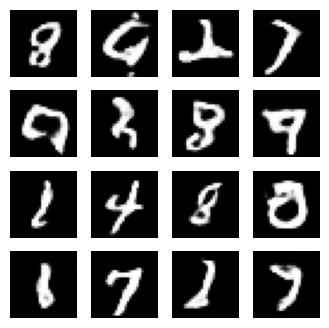

Epoch 90/100   Gen Loss: 0.7784   Disc Loss: 1.2541


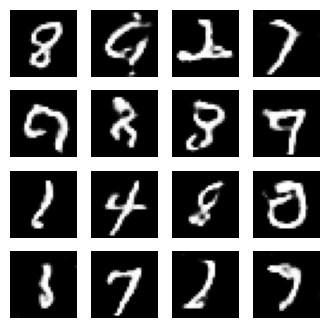

Epoch 91/100   Gen Loss: 0.8588   Disc Loss: 1.2389


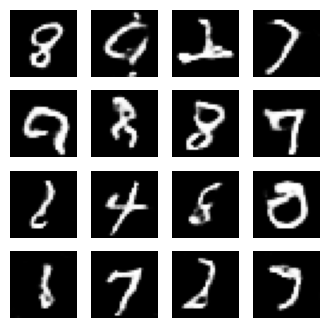

Epoch 92/100   Gen Loss: 0.7995   Disc Loss: 1.2846


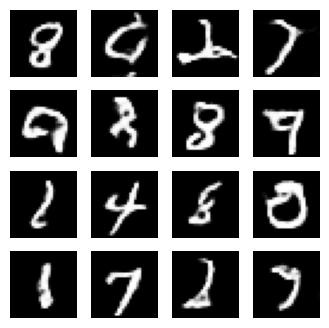

Epoch 93/100   Gen Loss: 0.8421   Disc Loss: 1.2382


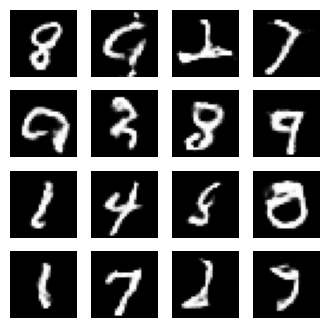

Epoch 94/100   Gen Loss: 0.8000   Disc Loss: 1.3114


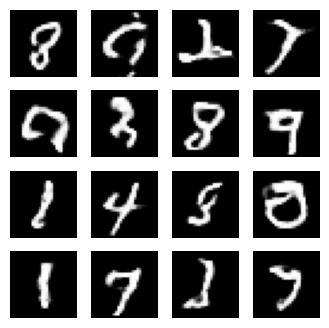

Epoch 95/100   Gen Loss: 0.8054   Disc Loss: 1.4287


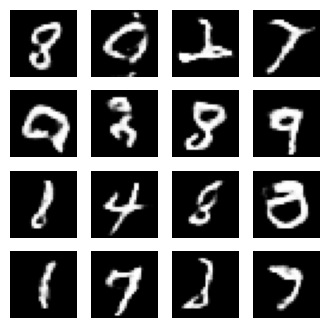

Epoch 96/100   Gen Loss: 0.8760   Disc Loss: 1.2722


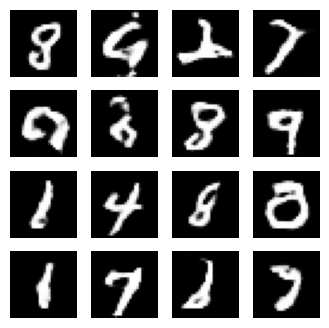

Epoch 97/100   Gen Loss: 0.7637   Disc Loss: 1.3635


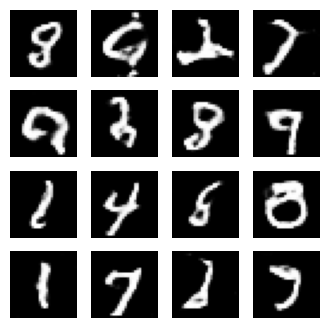

Epoch 98/100   Gen Loss: 0.7677   Disc Loss: 1.3007


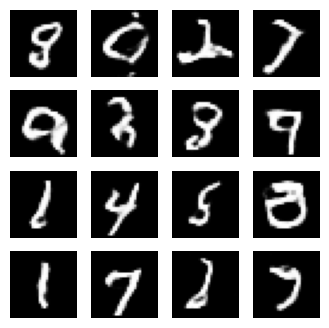

Epoch 99/100   Gen Loss: 0.8379   Disc Loss: 1.3461


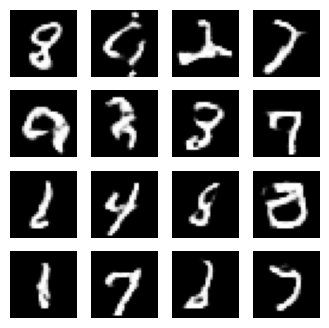

Epoch 100/100   Gen Loss: 0.9895   Disc Loss: 1.2164


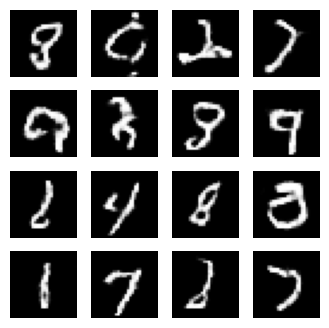

In [6]:
# Training Loop

def train(epochs=100):
    fixed_noise = tf.random.normal([16, 100])

    for epoch in range(epochs):
        for img_batch in dataset:
            gen_loss, disc_loss = train_step(img_batch)

        # Show sample results
        print(f"Epoch {epoch+1}/{epochs}   Gen Loss: {gen_loss:.4f}   Disc Loss: {disc_loss:.4f}")

        fake_imgs = generator(fixed_noise, training=False)
        fake_imgs = (fake_imgs + 1) / 2.0

        plt.figure(figsize=(4,4))
        for i in range(16):
            plt.subplot(4,4,i+1)
            plt.imshow(fake_imgs[i,:,:,0], cmap='gray')
            plt.axis('off')
        plt.show()

train(epochs=100)

# Increase in the number of Epochs (200)

Epoch 1/200   Gen Loss: 1.0316   Disc Loss: 0.9816


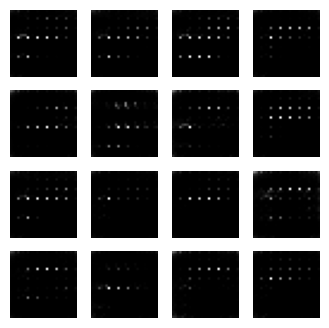

Epoch 2/200   Gen Loss: 1.1967   Disc Loss: 1.0415


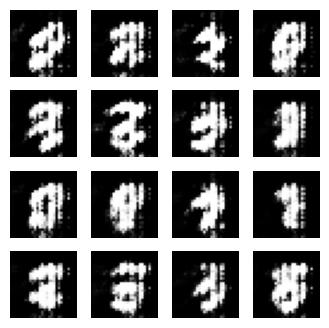

Epoch 3/200   Gen Loss: 1.2042   Disc Loss: 1.0011


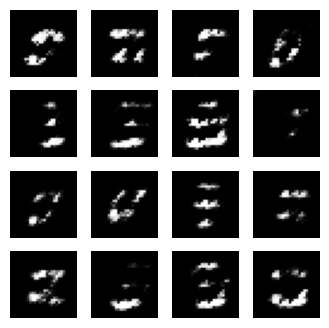

Epoch 4/200   Gen Loss: 1.0025   Disc Loss: 1.2559


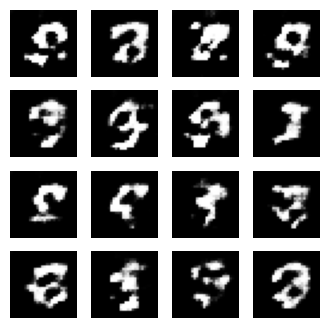

Epoch 5/200   Gen Loss: 1.0038   Disc Loss: 1.4620


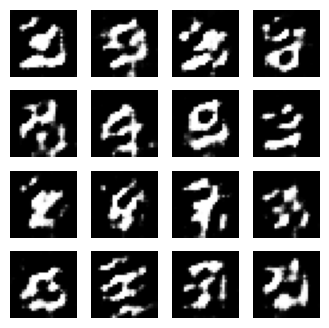

Epoch 6/200   Gen Loss: 1.1107   Disc Loss: 1.0489


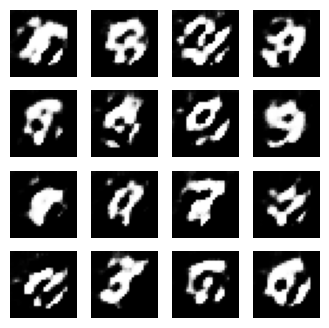

Epoch 7/200   Gen Loss: 1.0082   Disc Loss: 1.1569


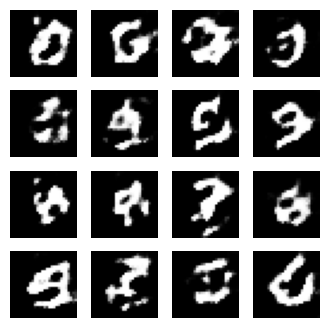

Epoch 8/200   Gen Loss: 1.2030   Disc Loss: 0.9670


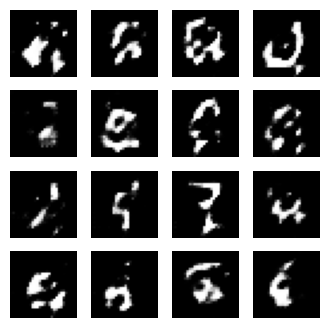

Epoch 9/200   Gen Loss: 0.9925   Disc Loss: 1.1634


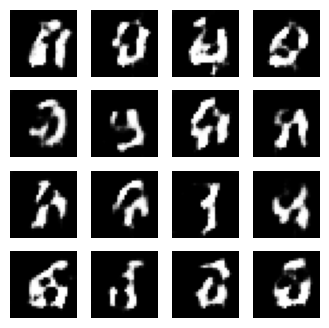

Epoch 10/200   Gen Loss: 1.3596   Disc Loss: 0.9233


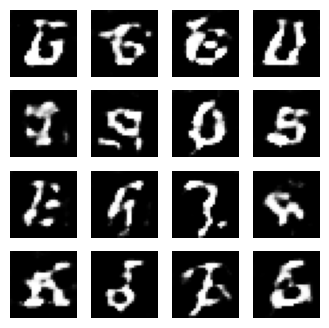

Epoch 11/200   Gen Loss: 1.1612   Disc Loss: 1.0823


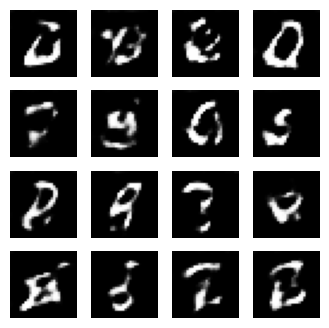

Epoch 12/200   Gen Loss: 1.3602   Disc Loss: 0.9780


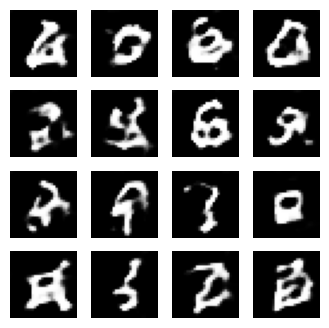

Epoch 13/200   Gen Loss: 1.1758   Disc Loss: 1.1696


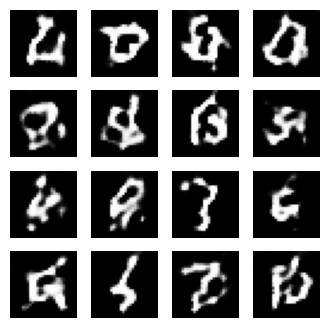

Epoch 14/200   Gen Loss: 1.0723   Disc Loss: 1.0853


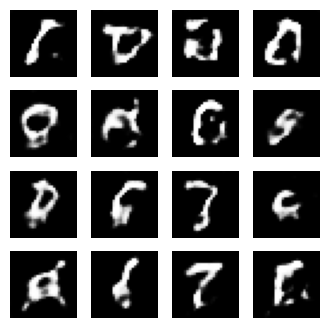

Epoch 15/200   Gen Loss: 0.9494   Disc Loss: 1.2830


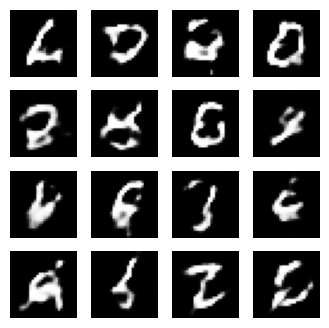

Epoch 16/200   Gen Loss: 1.0843   Disc Loss: 1.0435


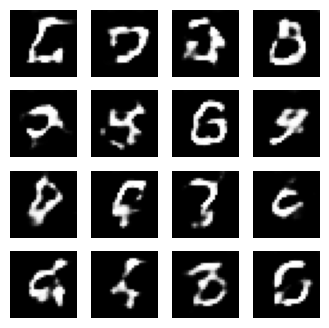

Epoch 17/200   Gen Loss: 0.8709   Disc Loss: 1.2367


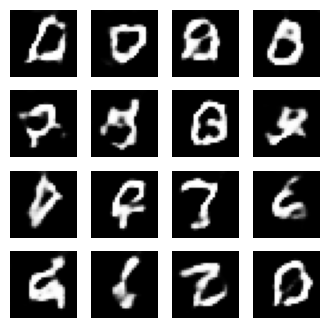

Epoch 18/200   Gen Loss: 0.8954   Disc Loss: 1.1656


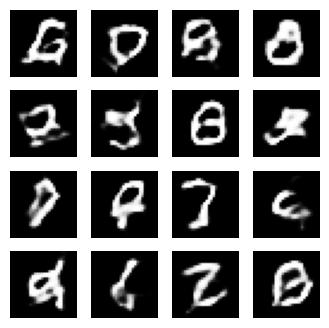

Epoch 19/200   Gen Loss: 0.8334   Disc Loss: 1.2335


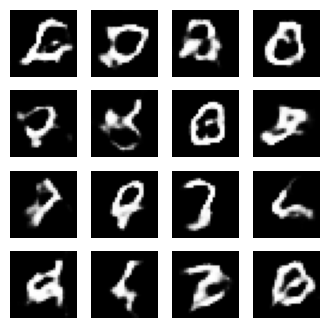

Epoch 20/200   Gen Loss: 1.0714   Disc Loss: 1.2524


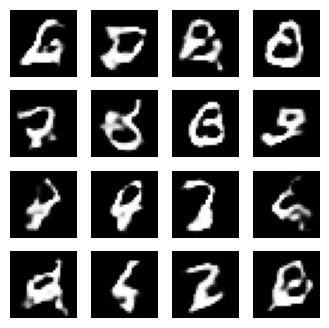

Epoch 21/200   Gen Loss: 0.9560   Disc Loss: 1.1425


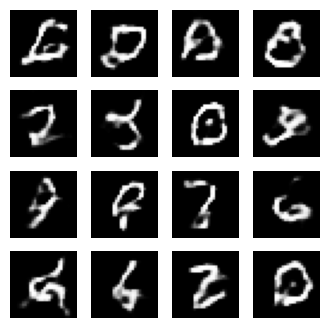

Epoch 22/200   Gen Loss: 0.8954   Disc Loss: 1.3136


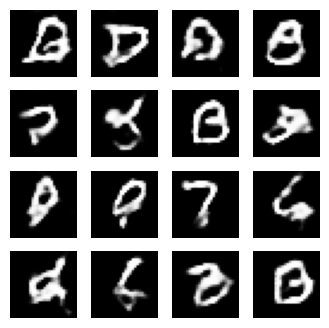

Epoch 23/200   Gen Loss: 0.9340   Disc Loss: 1.2894


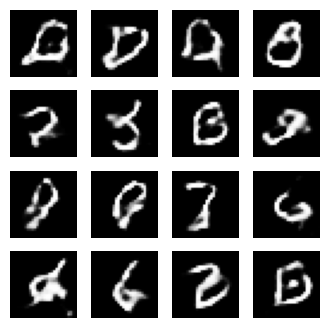

Epoch 24/200   Gen Loss: 1.0711   Disc Loss: 1.0182


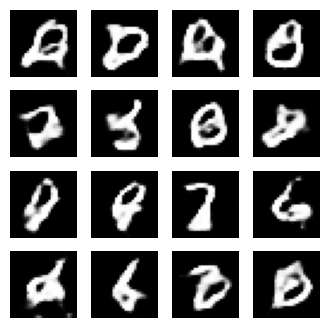

Epoch 25/200   Gen Loss: 1.0193   Disc Loss: 1.3066


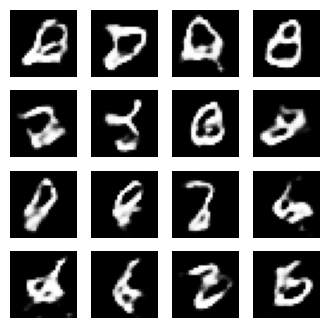

Epoch 26/200   Gen Loss: 0.8560   Disc Loss: 1.2317


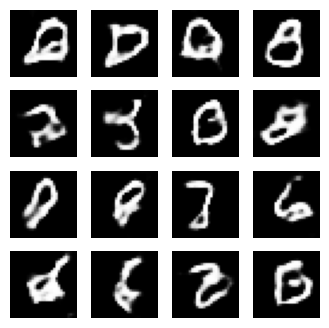

Epoch 27/200   Gen Loss: 0.8155   Disc Loss: 1.3605


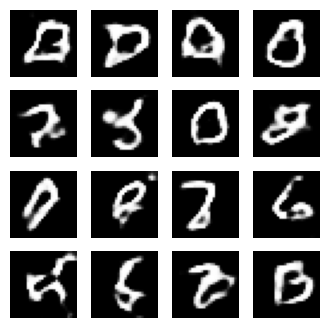

Epoch 28/200   Gen Loss: 0.9202   Disc Loss: 1.3014


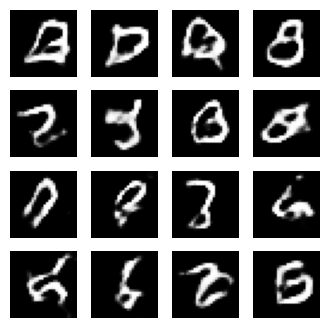

Epoch 29/200   Gen Loss: 0.9277   Disc Loss: 1.2782


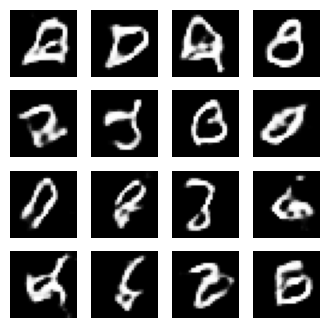

Epoch 30/200   Gen Loss: 0.8072   Disc Loss: 1.3879


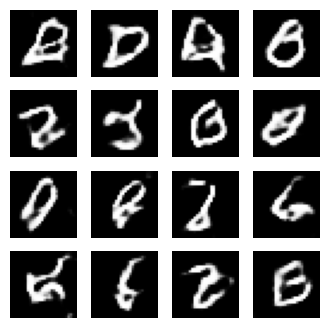

Epoch 31/200   Gen Loss: 0.8749   Disc Loss: 1.4360


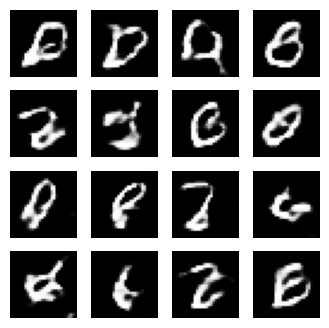

Epoch 32/200   Gen Loss: 0.9012   Disc Loss: 1.3307


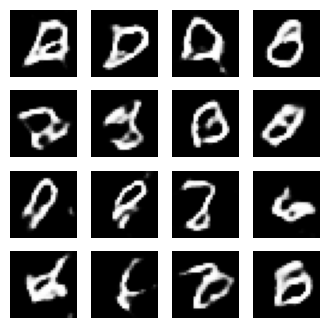

Epoch 33/200   Gen Loss: 0.8489   Disc Loss: 1.2997


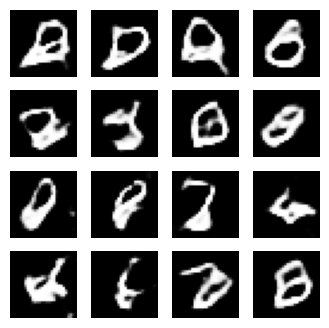

Epoch 34/200   Gen Loss: 0.8897   Disc Loss: 1.3302


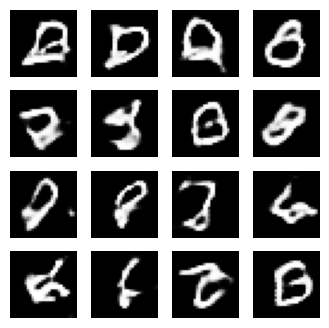

Epoch 35/200   Gen Loss: 0.7642   Disc Loss: 1.2681


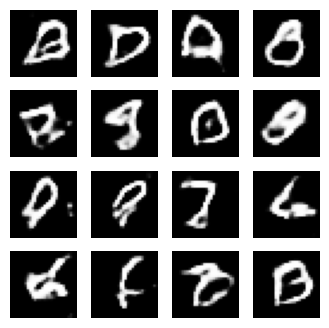

Epoch 36/200   Gen Loss: 0.8594   Disc Loss: 1.2599


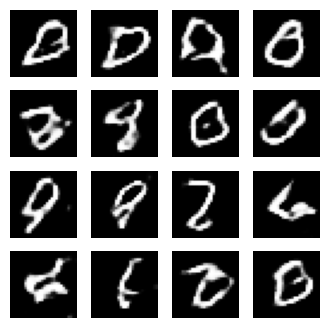

Epoch 37/200   Gen Loss: 0.8353   Disc Loss: 1.2016


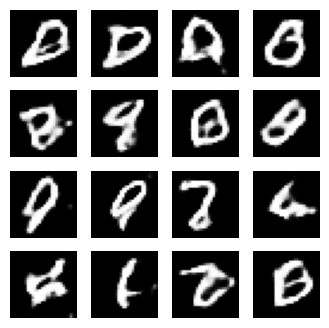

Epoch 38/200   Gen Loss: 0.9711   Disc Loss: 1.1435


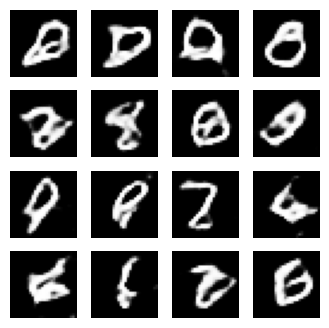

Epoch 39/200   Gen Loss: 1.0360   Disc Loss: 1.2130


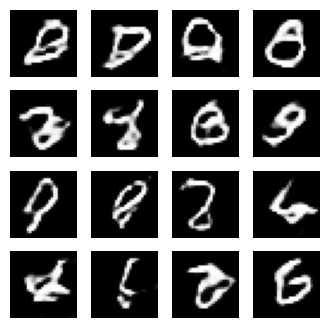

Epoch 40/200   Gen Loss: 0.9123   Disc Loss: 1.1784


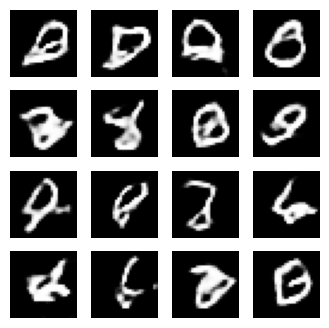

Epoch 41/200   Gen Loss: 0.8910   Disc Loss: 1.2043


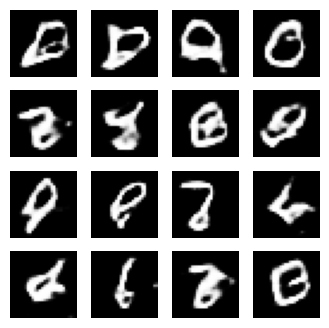

Epoch 42/200   Gen Loss: 1.0088   Disc Loss: 1.1556


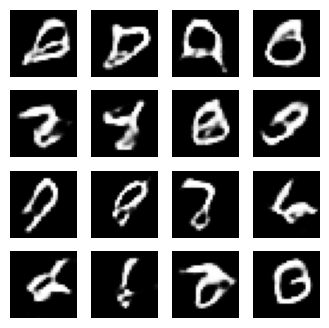

Epoch 43/200   Gen Loss: 1.0562   Disc Loss: 1.1427


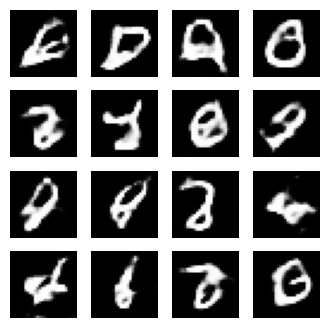

Epoch 44/200   Gen Loss: 1.0496   Disc Loss: 1.2591


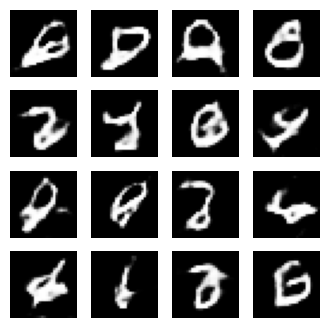

Epoch 45/200   Gen Loss: 0.8742   Disc Loss: 1.2705


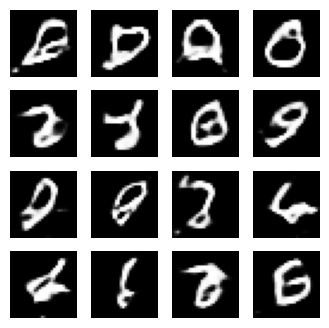

Epoch 46/200   Gen Loss: 0.8033   Disc Loss: 1.2923


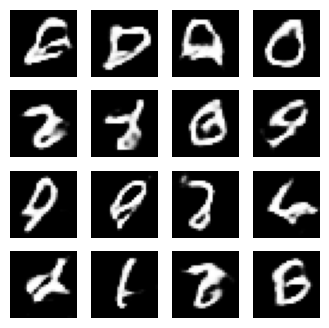

Epoch 47/200   Gen Loss: 0.9694   Disc Loss: 1.1909


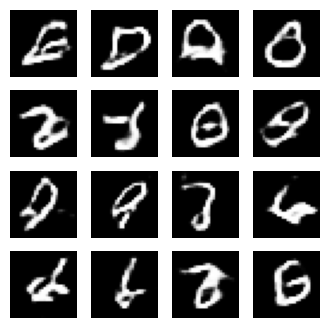

Epoch 48/200   Gen Loss: 0.8400   Disc Loss: 1.4699


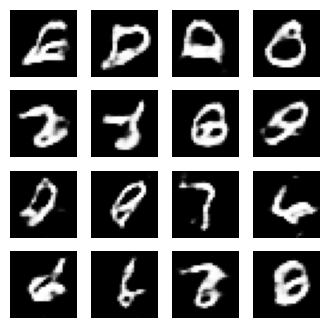

Epoch 49/200   Gen Loss: 0.8634   Disc Loss: 1.2775


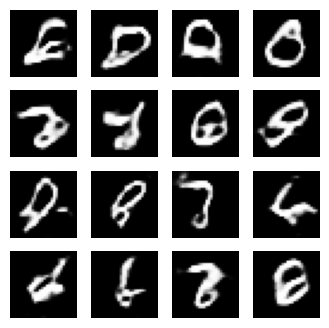

Epoch 50/200   Gen Loss: 0.9288   Disc Loss: 1.2960


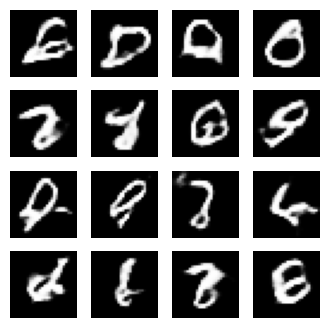

Epoch 51/200   Gen Loss: 0.9777   Disc Loss: 1.2091


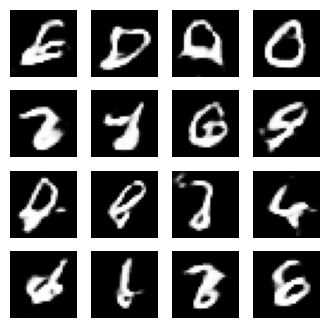

Epoch 52/200   Gen Loss: 0.8487   Disc Loss: 1.3166


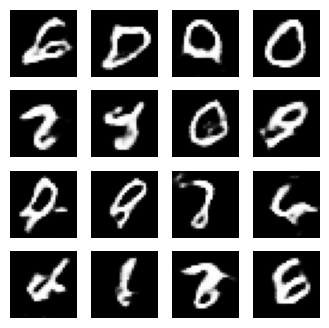

Epoch 53/200   Gen Loss: 0.9950   Disc Loss: 1.2362


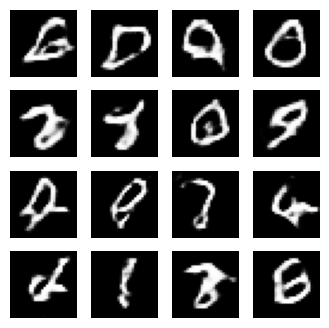

Epoch 54/200   Gen Loss: 0.9859   Disc Loss: 1.1149


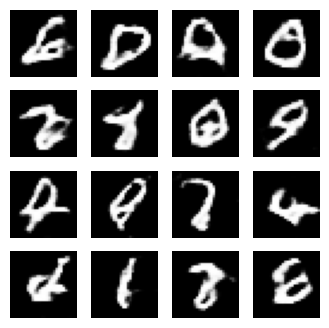

Epoch 55/200   Gen Loss: 1.0174   Disc Loss: 1.2879


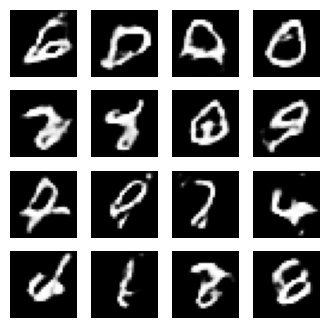

Epoch 56/200   Gen Loss: 0.8954   Disc Loss: 1.4406


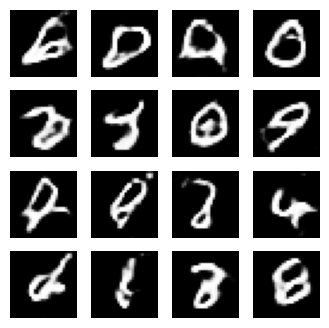

Epoch 57/200   Gen Loss: 0.9123   Disc Loss: 1.2343


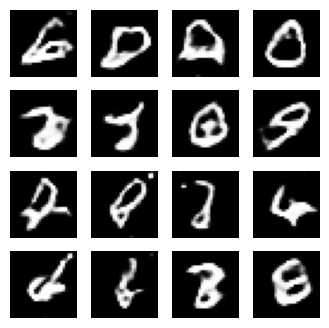

Epoch 58/200   Gen Loss: 0.9595   Disc Loss: 1.2767


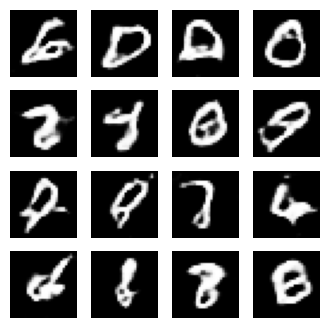

Epoch 59/200   Gen Loss: 0.9278   Disc Loss: 1.1713


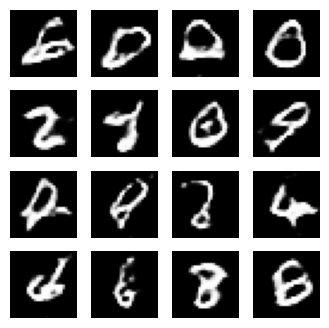

Epoch 60/200   Gen Loss: 0.9186   Disc Loss: 1.3220


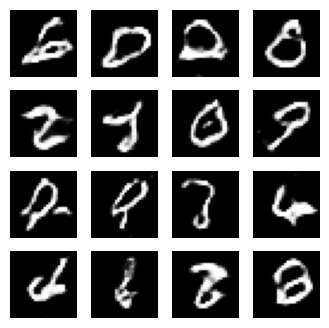

Epoch 61/200   Gen Loss: 0.8317   Disc Loss: 1.2270


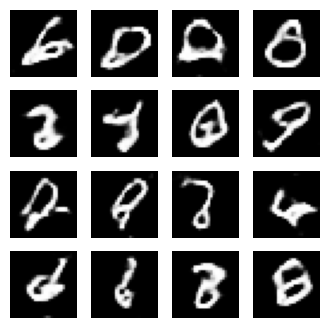

Epoch 62/200   Gen Loss: 0.9743   Disc Loss: 1.2684


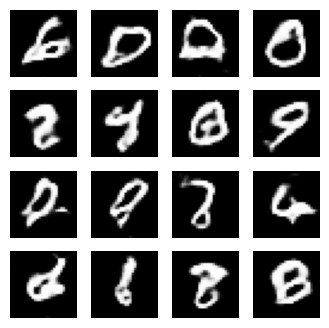

Epoch 63/200   Gen Loss: 0.8794   Disc Loss: 1.2944


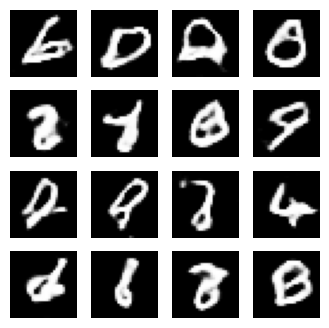

Epoch 64/200   Gen Loss: 0.8160   Disc Loss: 1.3032


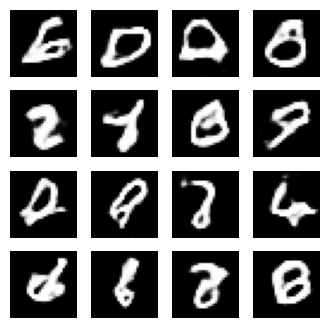

Epoch 65/200   Gen Loss: 0.9947   Disc Loss: 1.3011


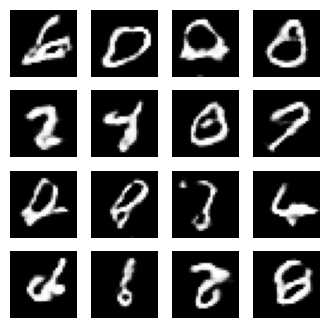

Epoch 66/200   Gen Loss: 0.7761   Disc Loss: 1.3538


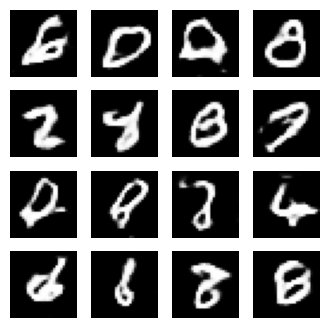

Epoch 67/200   Gen Loss: 0.8616   Disc Loss: 1.2995


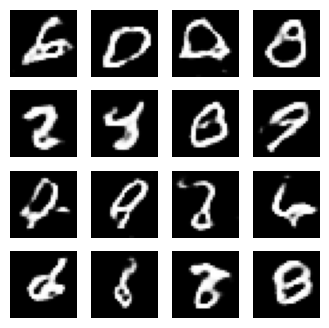

Epoch 68/200   Gen Loss: 0.8356   Disc Loss: 1.4958


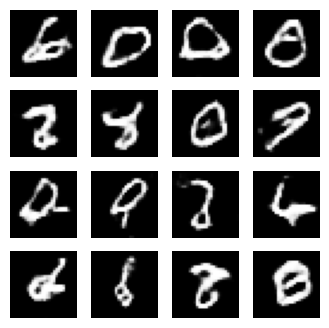

Epoch 69/200   Gen Loss: 0.9226   Disc Loss: 1.2265


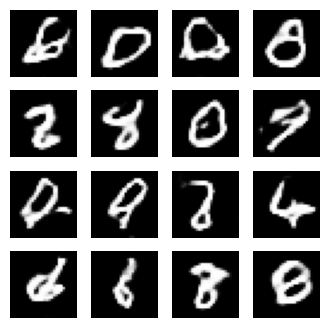

Epoch 70/200   Gen Loss: 0.9171   Disc Loss: 1.2539


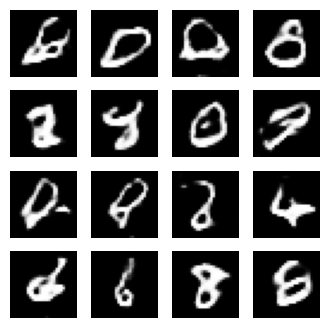

Epoch 71/200   Gen Loss: 0.9867   Disc Loss: 1.2445


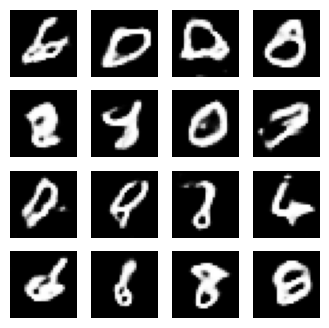

Epoch 72/200   Gen Loss: 0.7988   Disc Loss: 1.2412


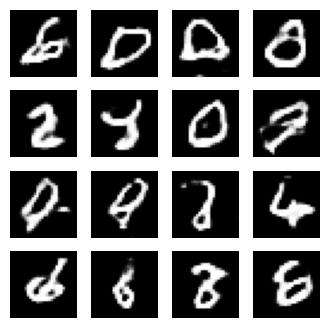

Epoch 73/200   Gen Loss: 0.9268   Disc Loss: 1.3098


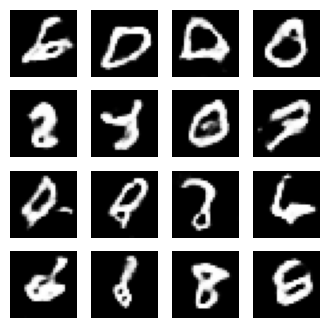

Epoch 74/200   Gen Loss: 0.9548   Disc Loss: 1.2346


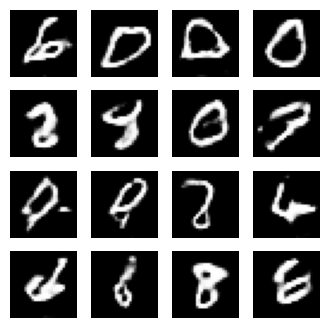

Epoch 75/200   Gen Loss: 0.8230   Disc Loss: 1.2807


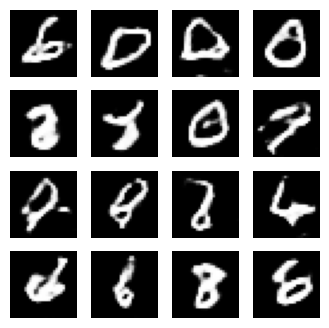

Epoch 76/200   Gen Loss: 0.8912   Disc Loss: 1.3158


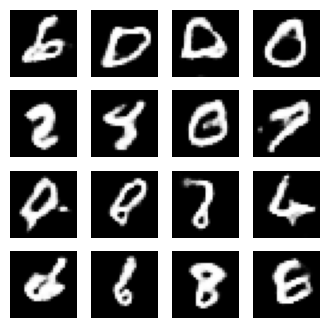

Epoch 77/200   Gen Loss: 0.8897   Disc Loss: 1.1102


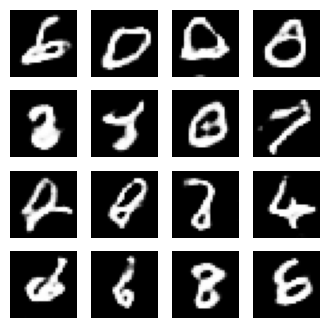

Epoch 78/200   Gen Loss: 0.8393   Disc Loss: 1.2937


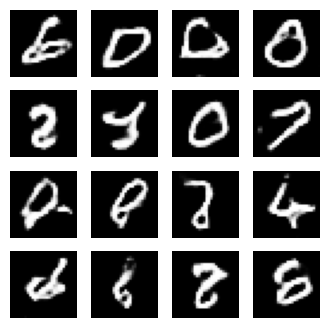

Epoch 79/200   Gen Loss: 0.8035   Disc Loss: 1.3117


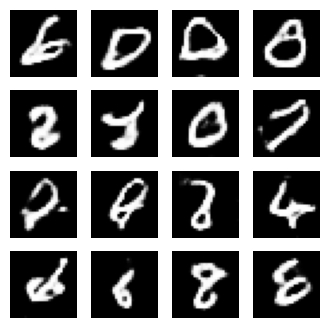

Epoch 80/200   Gen Loss: 0.8303   Disc Loss: 1.4054


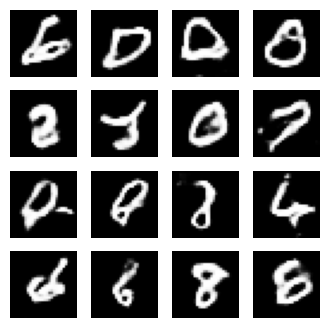

Epoch 81/200   Gen Loss: 0.8256   Disc Loss: 1.2619


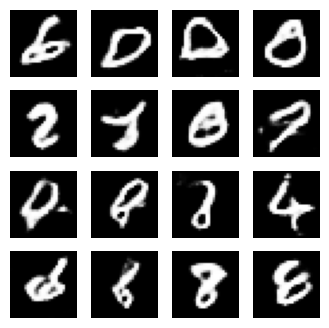

Epoch 82/200   Gen Loss: 0.8350   Disc Loss: 1.3047


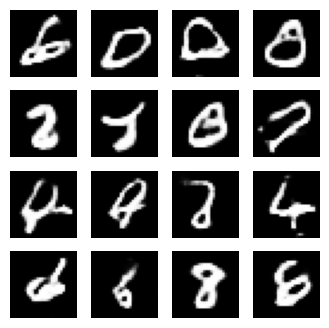

Epoch 83/200   Gen Loss: 1.0383   Disc Loss: 1.3042


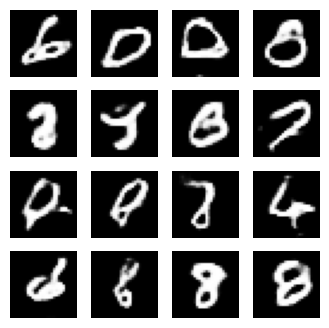

Epoch 84/200   Gen Loss: 0.8415   Disc Loss: 1.2819


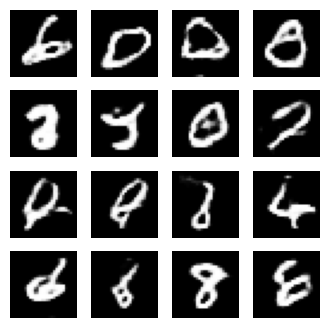

Epoch 85/200   Gen Loss: 1.0439   Disc Loss: 1.2867


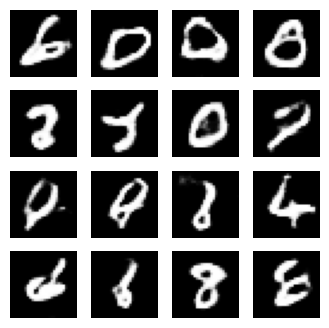

Epoch 86/200   Gen Loss: 0.7653   Disc Loss: 1.3870


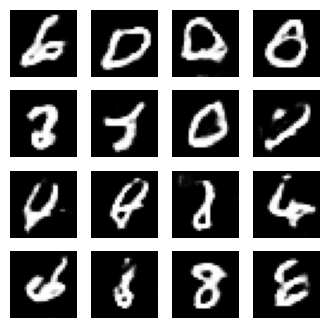

Epoch 87/200   Gen Loss: 1.0290   Disc Loss: 1.2686


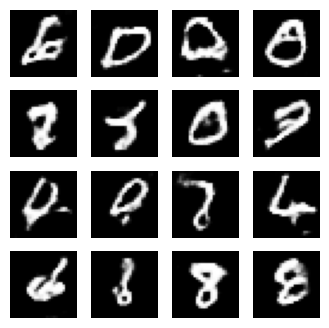

Epoch 88/200   Gen Loss: 0.8580   Disc Loss: 1.3394


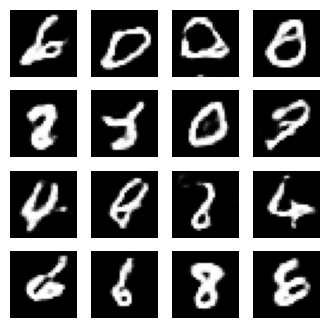

Epoch 89/200   Gen Loss: 0.8309   Disc Loss: 1.2188


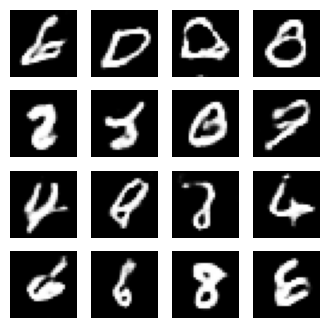

Epoch 90/200   Gen Loss: 0.8324   Disc Loss: 1.2608


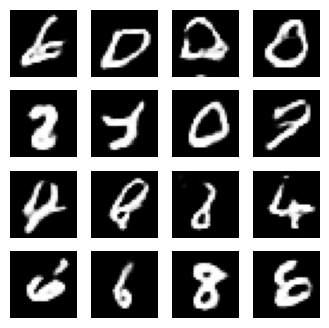

Epoch 91/200   Gen Loss: 0.8764   Disc Loss: 1.1365


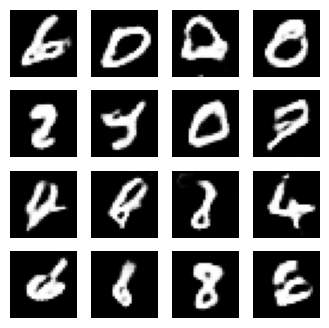

Epoch 92/200   Gen Loss: 0.8594   Disc Loss: 1.2428


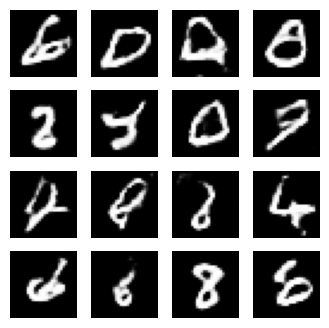

Epoch 93/200   Gen Loss: 0.9460   Disc Loss: 1.2657


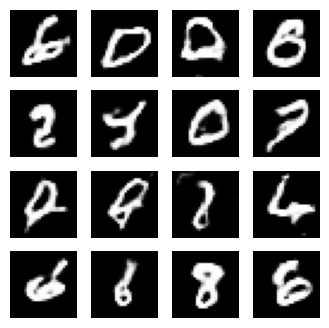

Epoch 94/200   Gen Loss: 0.8366   Disc Loss: 1.2428


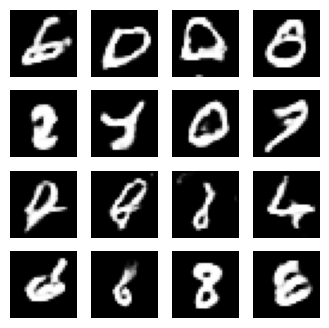

Epoch 95/200   Gen Loss: 0.8050   Disc Loss: 1.3280


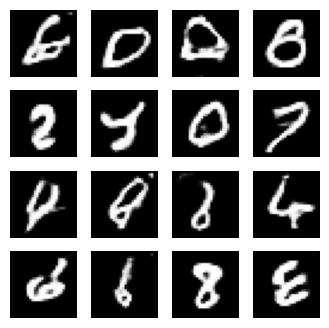

Epoch 96/200   Gen Loss: 0.8942   Disc Loss: 1.2259


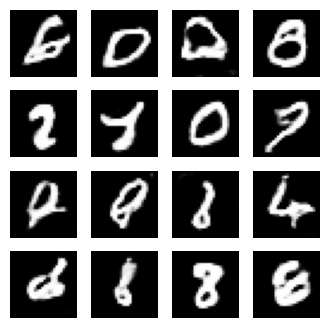

Epoch 97/200   Gen Loss: 0.9952   Disc Loss: 1.2138


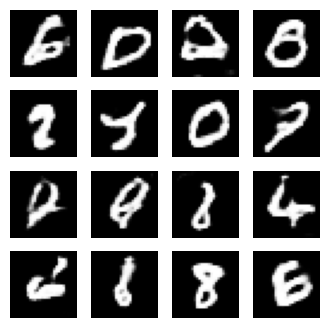

Epoch 98/200   Gen Loss: 0.8131   Disc Loss: 1.2488


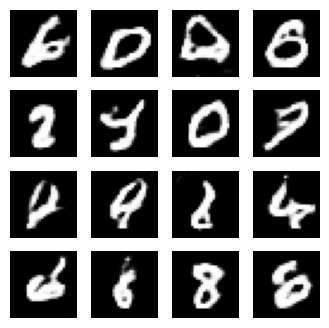

Epoch 99/200   Gen Loss: 0.8618   Disc Loss: 1.2921


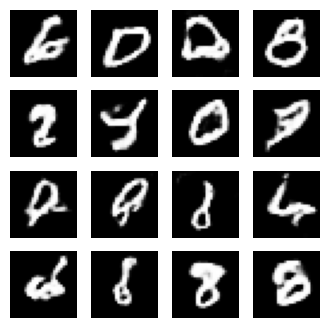

Epoch 100/200   Gen Loss: 0.8527   Disc Loss: 1.3206


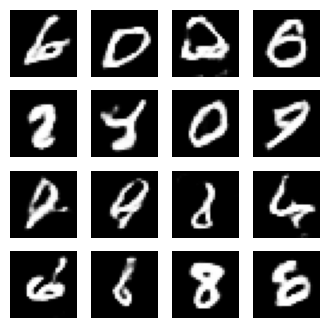

Epoch 101/200   Gen Loss: 0.7616   Disc Loss: 1.3223


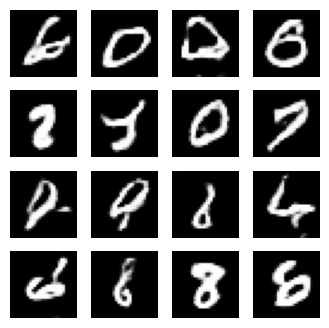

Epoch 102/200   Gen Loss: 0.8894   Disc Loss: 1.3131


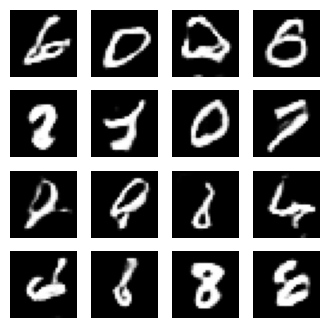

Epoch 103/200   Gen Loss: 0.7193   Disc Loss: 1.3441


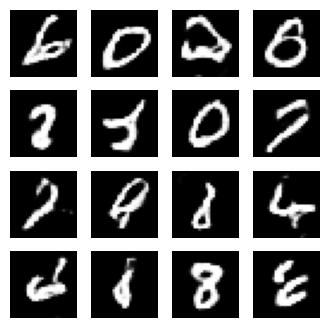

Epoch 104/200   Gen Loss: 1.1146   Disc Loss: 1.1189


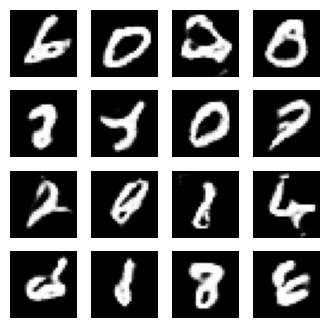

Epoch 105/200   Gen Loss: 0.8887   Disc Loss: 1.2374


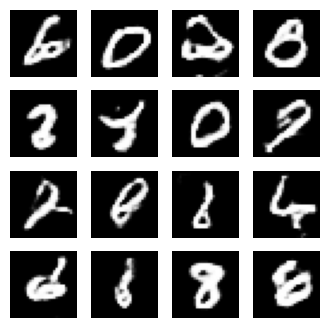

Epoch 106/200   Gen Loss: 0.8076   Disc Loss: 1.2572


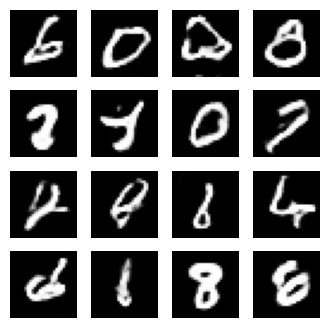

Epoch 107/200   Gen Loss: 0.8744   Disc Loss: 1.3325


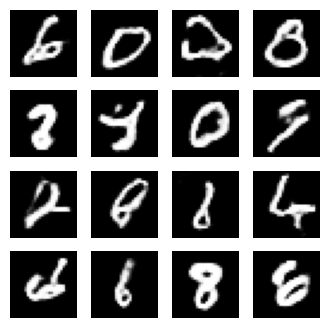

Epoch 108/200   Gen Loss: 0.7514   Disc Loss: 1.4660


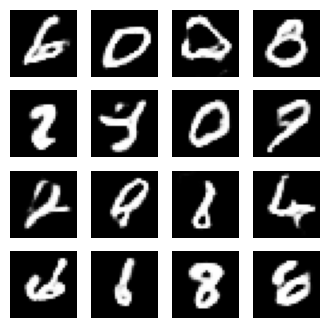

Epoch 109/200   Gen Loss: 0.7398   Disc Loss: 1.2366


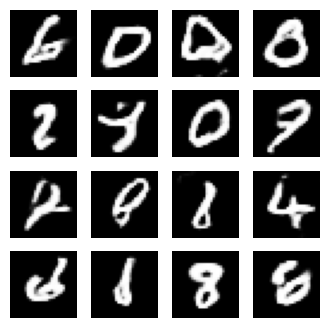

Epoch 110/200   Gen Loss: 0.8199   Disc Loss: 1.2358


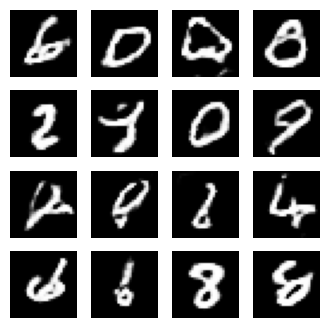

Epoch 111/200   Gen Loss: 0.7543   Disc Loss: 1.2846


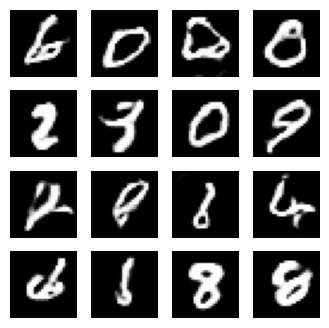

Epoch 112/200   Gen Loss: 0.8111   Disc Loss: 1.3194


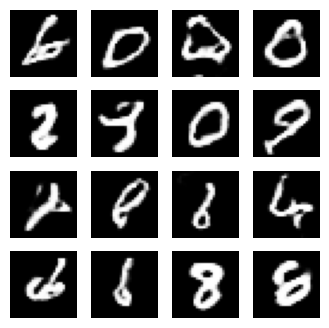

Epoch 113/200   Gen Loss: 0.7670   Disc Loss: 1.3889


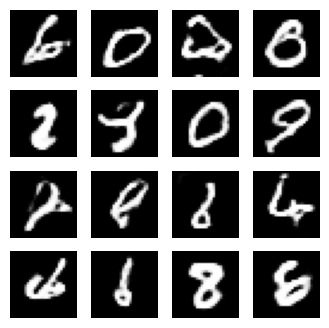

Epoch 114/200   Gen Loss: 0.8435   Disc Loss: 1.3799


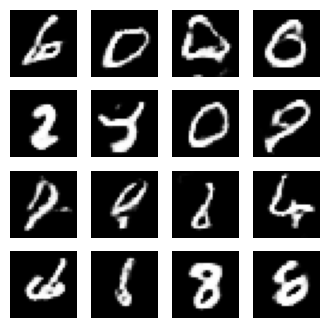

Epoch 115/200   Gen Loss: 0.8827   Disc Loss: 1.3596


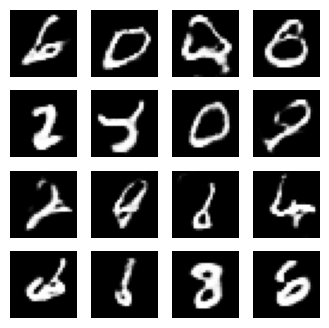

Epoch 116/200   Gen Loss: 0.8409   Disc Loss: 1.2939


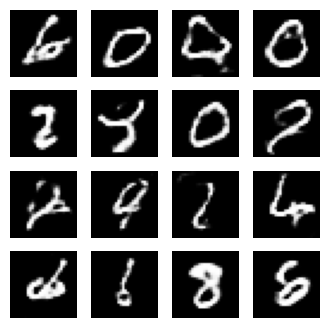

Epoch 117/200   Gen Loss: 0.8084   Disc Loss: 1.3020


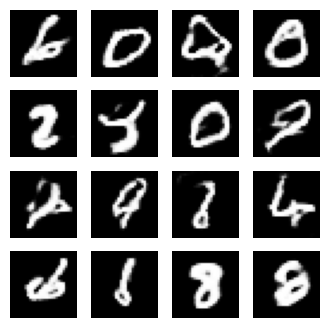

Epoch 118/200   Gen Loss: 0.7322   Disc Loss: 1.2949


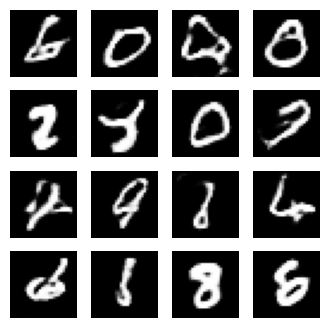

Epoch 119/200   Gen Loss: 0.7493   Disc Loss: 1.3744


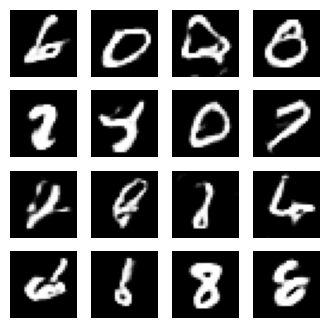

Epoch 120/200   Gen Loss: 0.8908   Disc Loss: 1.3176


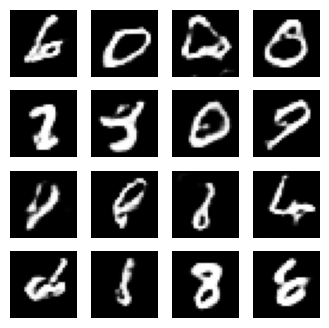

Epoch 121/200   Gen Loss: 0.7229   Disc Loss: 1.3484


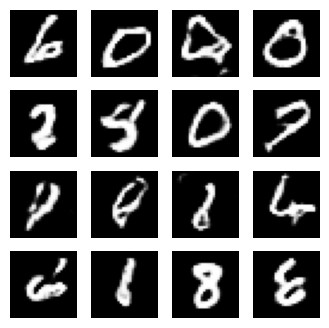

Epoch 122/200   Gen Loss: 0.9758   Disc Loss: 1.3427


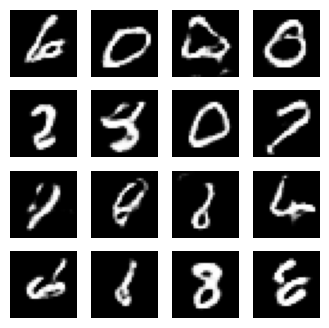

Epoch 123/200   Gen Loss: 0.8723   Disc Loss: 1.2466


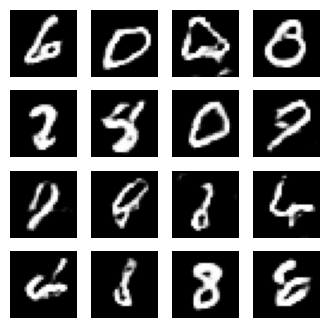

Epoch 124/200   Gen Loss: 0.8231   Disc Loss: 1.2782


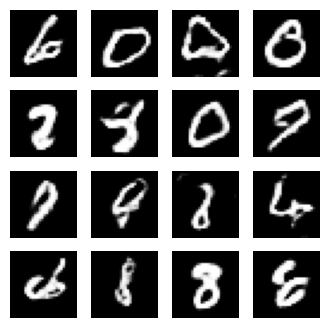

Epoch 125/200   Gen Loss: 0.8633   Disc Loss: 1.3449


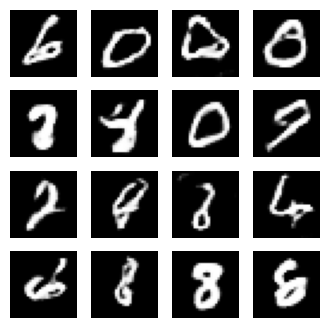

Epoch 126/200   Gen Loss: 0.8061   Disc Loss: 1.3438


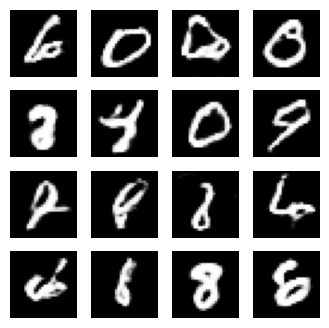

Epoch 127/200   Gen Loss: 0.7760   Disc Loss: 1.2725


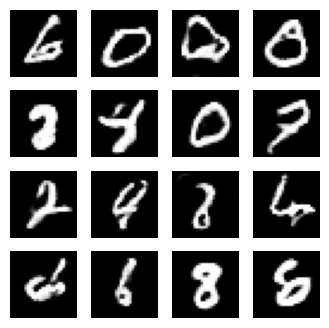

Epoch 128/200   Gen Loss: 0.7118   Disc Loss: 1.3906


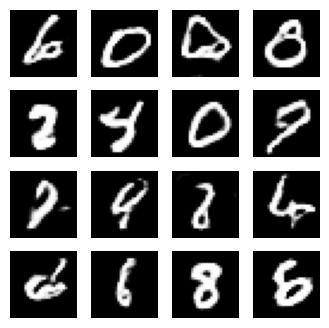

Epoch 129/200   Gen Loss: 0.8251   Disc Loss: 1.2722


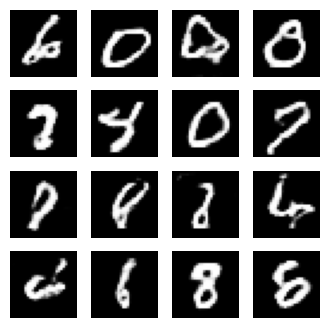

Epoch 130/200   Gen Loss: 0.8456   Disc Loss: 1.2780


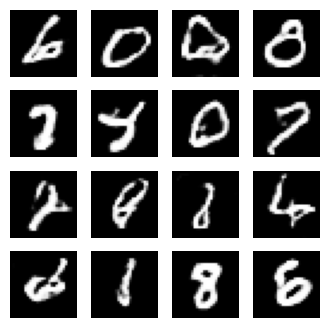

Epoch 131/200   Gen Loss: 0.8953   Disc Loss: 1.2968


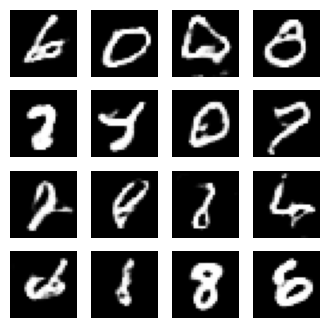

Epoch 132/200   Gen Loss: 0.7991   Disc Loss: 1.2784


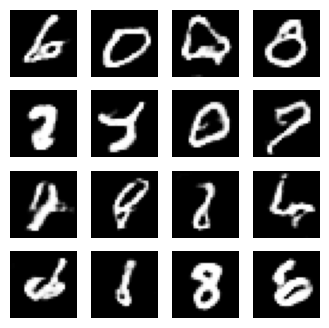

Epoch 133/200   Gen Loss: 0.7893   Disc Loss: 1.3410


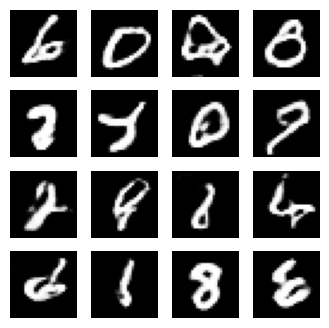

Epoch 134/200   Gen Loss: 0.7895   Disc Loss: 1.3975


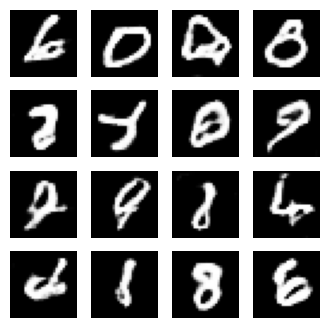

Epoch 135/200   Gen Loss: 0.8736   Disc Loss: 1.2310


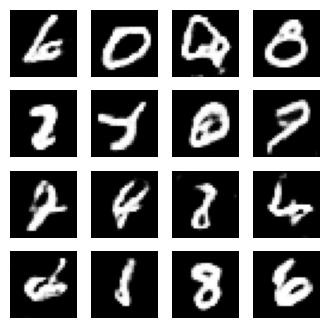

Epoch 136/200   Gen Loss: 0.7888   Disc Loss: 1.2448


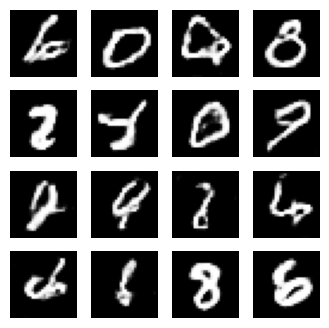

Epoch 137/200   Gen Loss: 0.7743   Disc Loss: 1.2644


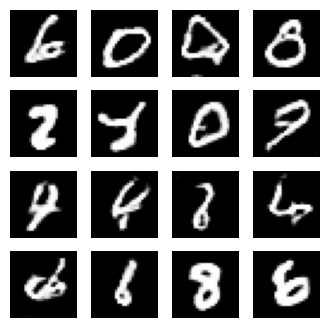

Epoch 138/200   Gen Loss: 0.9814   Disc Loss: 1.2540


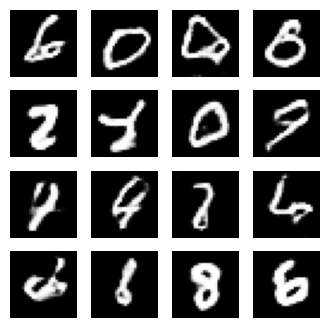

Epoch 139/200   Gen Loss: 0.7638   Disc Loss: 1.3051


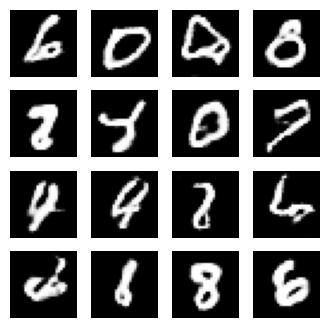

Epoch 140/200   Gen Loss: 0.8486   Disc Loss: 1.2345


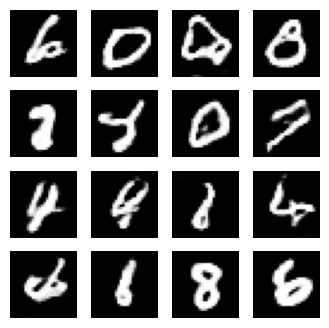

Epoch 141/200   Gen Loss: 0.8237   Disc Loss: 1.3286


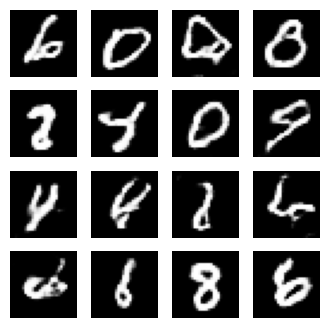

Epoch 142/200   Gen Loss: 0.8613   Disc Loss: 1.2569


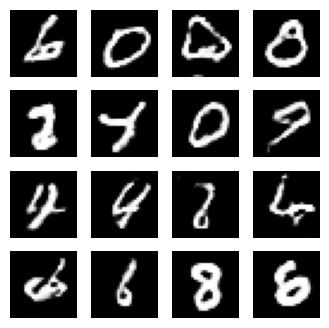

Epoch 143/200   Gen Loss: 0.9549   Disc Loss: 1.2982


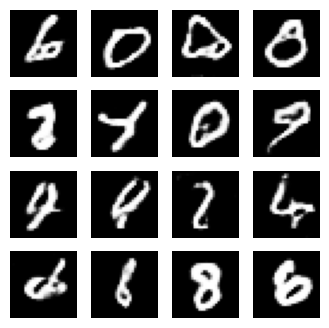

Epoch 144/200   Gen Loss: 0.8504   Disc Loss: 1.2957


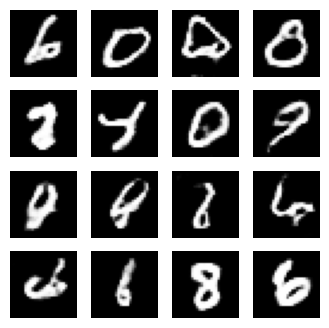

Epoch 145/200   Gen Loss: 0.8240   Disc Loss: 1.2753


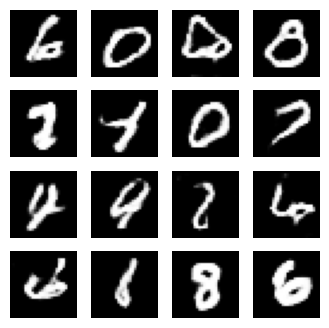

Epoch 146/200   Gen Loss: 0.8114   Disc Loss: 1.4111


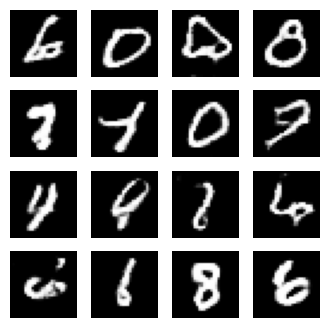

Epoch 147/200   Gen Loss: 0.8910   Disc Loss: 1.2668


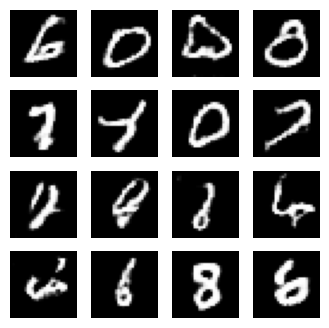

Epoch 148/200   Gen Loss: 0.8236   Disc Loss: 1.3513


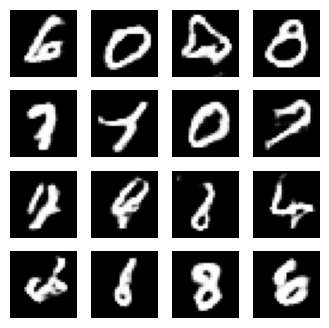

Epoch 149/200   Gen Loss: 0.8380   Disc Loss: 1.2582


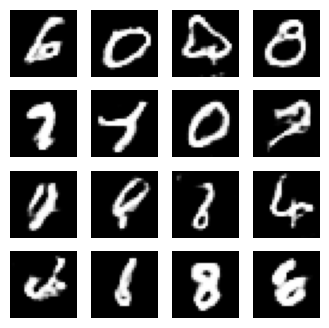

Epoch 150/200   Gen Loss: 0.8621   Disc Loss: 1.3252


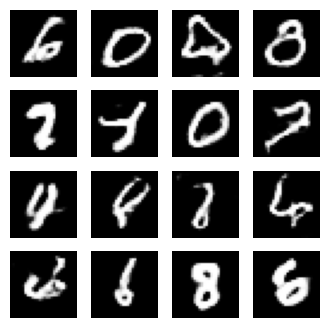

Epoch 151/200   Gen Loss: 0.8532   Disc Loss: 1.3103


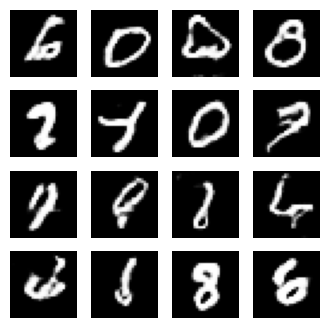

Epoch 152/200   Gen Loss: 0.8955   Disc Loss: 1.2407


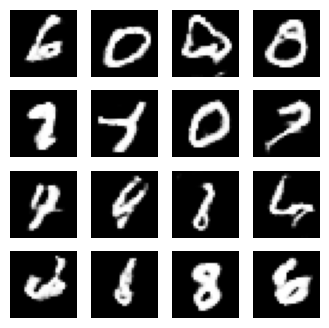

Epoch 153/200   Gen Loss: 0.8945   Disc Loss: 1.2960


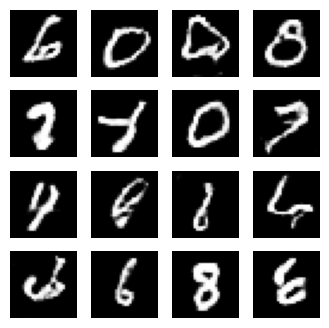

Epoch 154/200   Gen Loss: 0.8443   Disc Loss: 1.3264


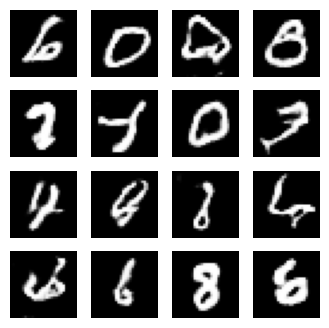

Epoch 155/200   Gen Loss: 0.8994   Disc Loss: 1.2012


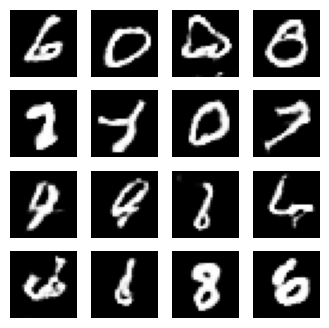

Epoch 156/200   Gen Loss: 0.8790   Disc Loss: 1.3499


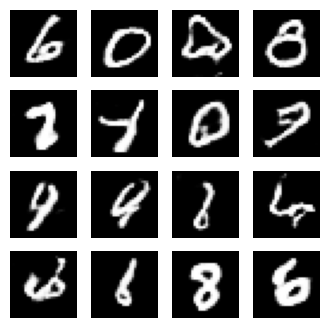

Epoch 157/200   Gen Loss: 0.8715   Disc Loss: 1.2860


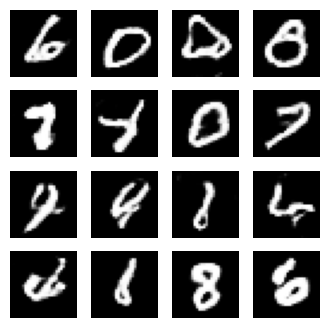

Epoch 158/200   Gen Loss: 0.8060   Disc Loss: 1.2787


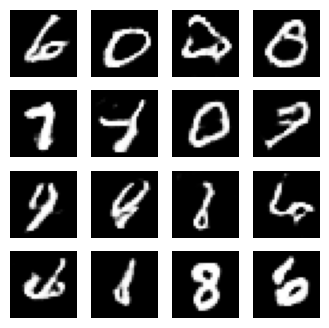

Epoch 159/200   Gen Loss: 0.8233   Disc Loss: 1.3085


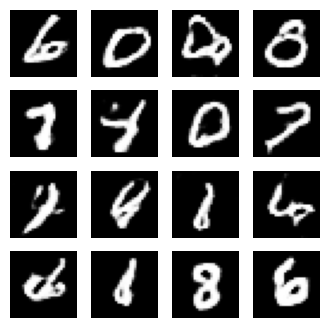

Epoch 160/200   Gen Loss: 0.8751   Disc Loss: 1.3361


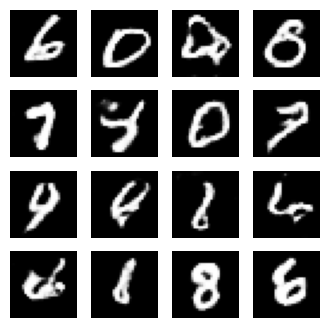

Epoch 161/200   Gen Loss: 0.8369   Disc Loss: 1.2519


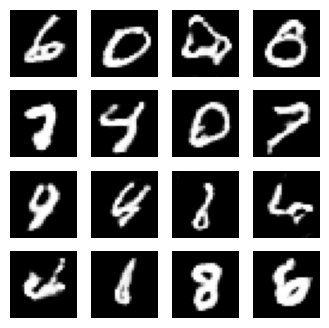

Epoch 162/200   Gen Loss: 0.7945   Disc Loss: 1.2956


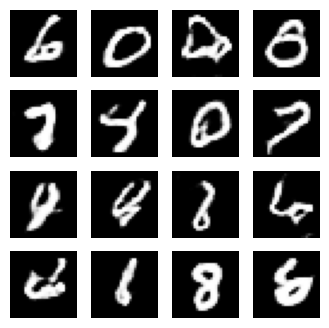

Epoch 163/200   Gen Loss: 0.7317   Disc Loss: 1.3114


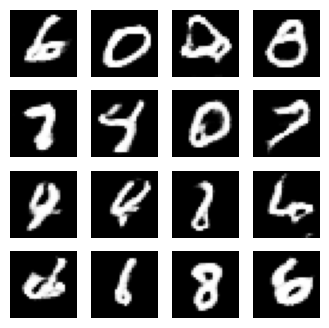

Epoch 164/200   Gen Loss: 0.7912   Disc Loss: 1.3584


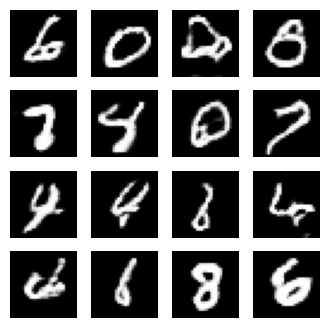

Epoch 165/200   Gen Loss: 0.8453   Disc Loss: 1.2808


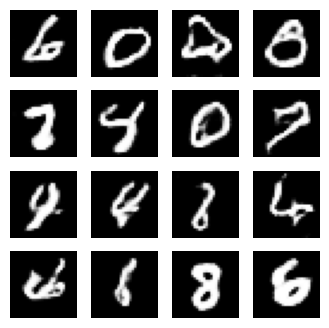

Epoch 166/200   Gen Loss: 0.8119   Disc Loss: 1.3085


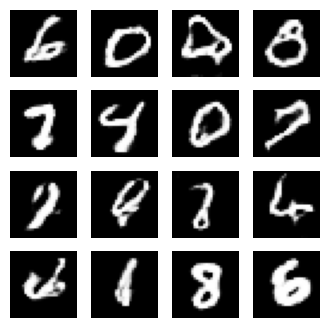

Epoch 167/200   Gen Loss: 0.8407   Disc Loss: 1.2668


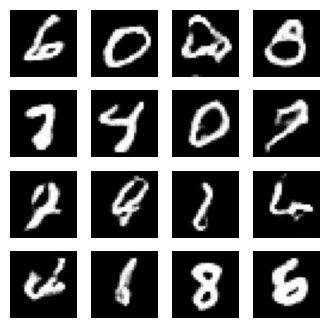

Epoch 168/200   Gen Loss: 0.8869   Disc Loss: 1.2782


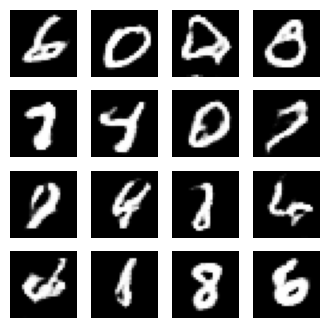

Epoch 169/200   Gen Loss: 0.8076   Disc Loss: 1.2671


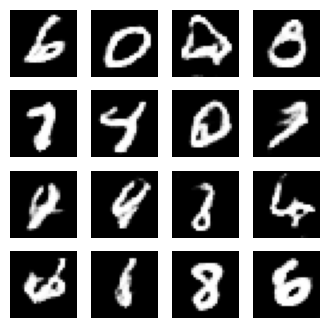

Epoch 170/200   Gen Loss: 0.7904   Disc Loss: 1.3760


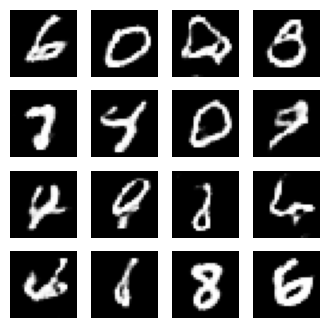

Epoch 171/200   Gen Loss: 0.7980   Disc Loss: 1.3306


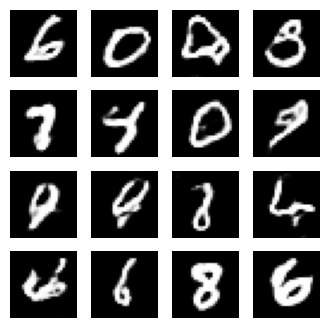

Epoch 172/200   Gen Loss: 0.8162   Disc Loss: 1.3249


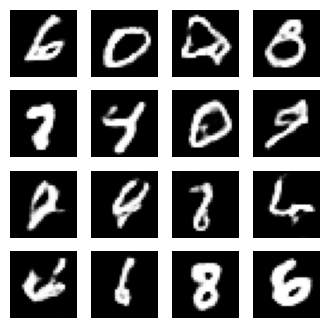

Epoch 173/200   Gen Loss: 0.7966   Disc Loss: 1.3012


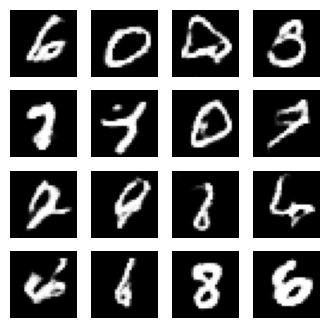

Epoch 174/200   Gen Loss: 0.7868   Disc Loss: 1.4149


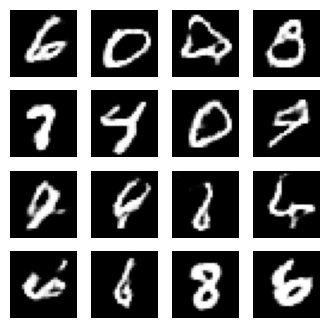

Epoch 175/200   Gen Loss: 0.8320   Disc Loss: 1.3143


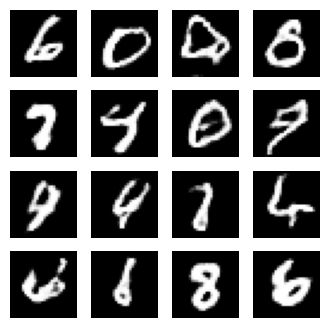

Epoch 176/200   Gen Loss: 0.8118   Disc Loss: 1.2903


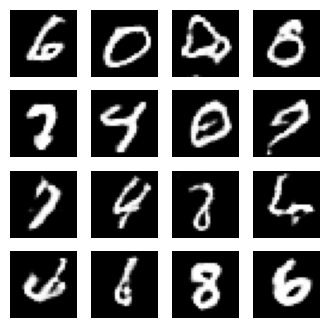

Epoch 177/200   Gen Loss: 0.8298   Disc Loss: 1.2971


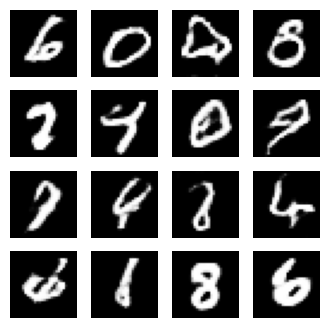

Epoch 178/200   Gen Loss: 0.8066   Disc Loss: 1.2841


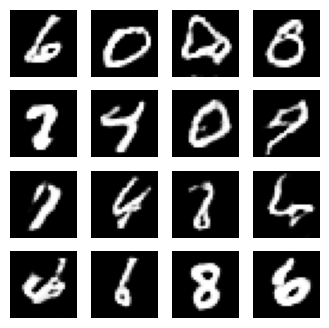

Epoch 179/200   Gen Loss: 0.8892   Disc Loss: 1.3364


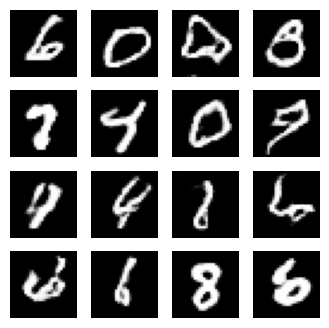

Epoch 180/200   Gen Loss: 0.8313   Disc Loss: 1.2955


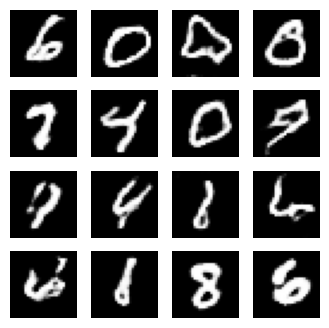

Epoch 181/200   Gen Loss: 0.9063   Disc Loss: 1.2303


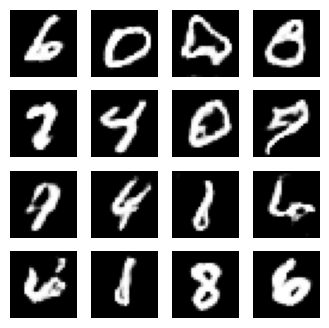

Epoch 182/200   Gen Loss: 0.7737   Disc Loss: 1.2706


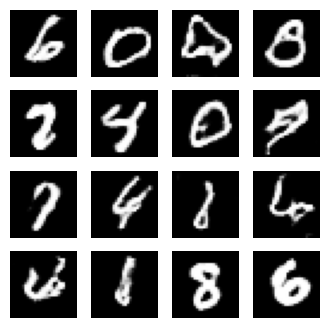

Epoch 183/200   Gen Loss: 0.7566   Disc Loss: 1.3538


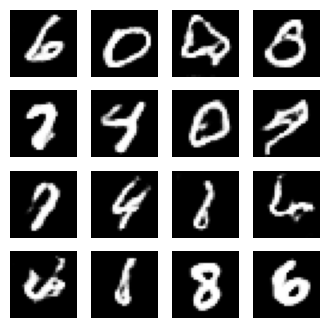

Epoch 184/200   Gen Loss: 0.7935   Disc Loss: 1.3414


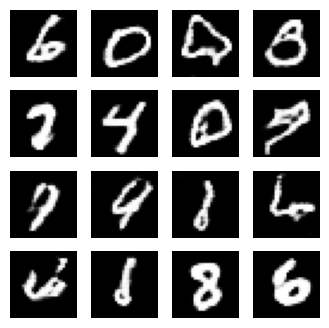

Epoch 185/200   Gen Loss: 0.8205   Disc Loss: 1.3177


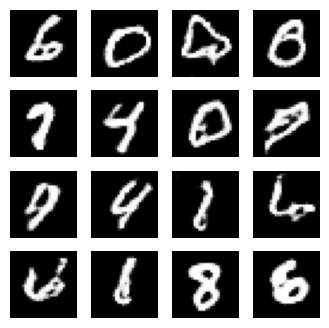

Epoch 186/200   Gen Loss: 0.8264   Disc Loss: 1.3247


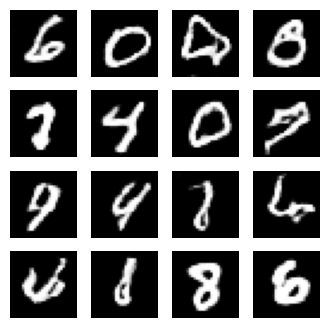

Epoch 187/200   Gen Loss: 0.7911   Disc Loss: 1.2817


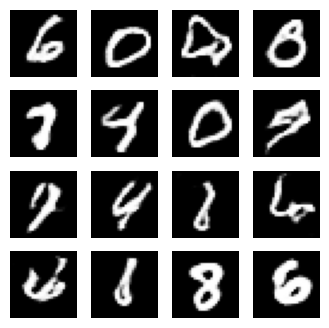

Epoch 188/200   Gen Loss: 0.8139   Disc Loss: 1.3368


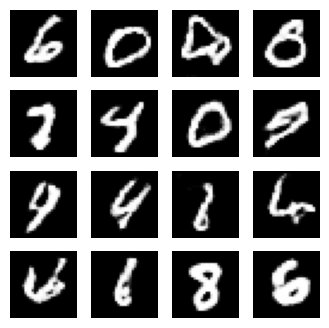

Epoch 189/200   Gen Loss: 0.8693   Disc Loss: 1.3003


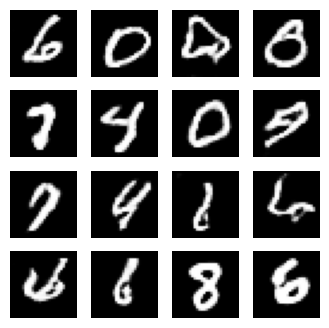

Epoch 190/200   Gen Loss: 0.7124   Disc Loss: 1.3290


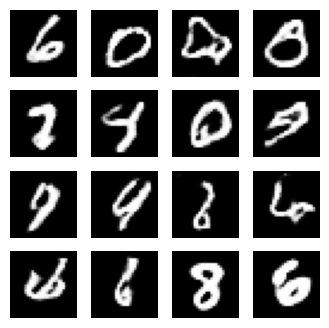

Epoch 191/200   Gen Loss: 0.7959   Disc Loss: 1.3736


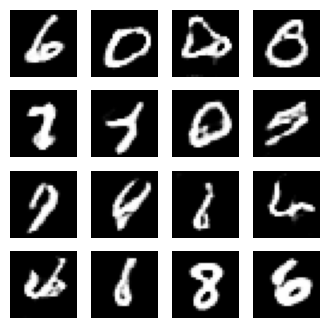

Epoch 192/200   Gen Loss: 0.9215   Disc Loss: 1.2839


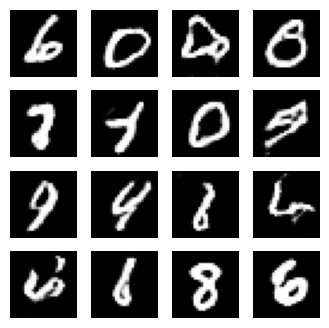

Epoch 193/200   Gen Loss: 0.8048   Disc Loss: 1.2838


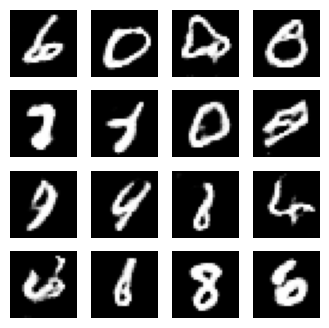

Epoch 194/200   Gen Loss: 0.8122   Disc Loss: 1.3048


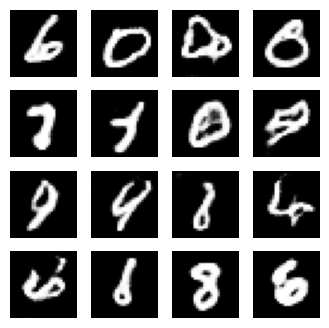

Epoch 195/200   Gen Loss: 0.7092   Disc Loss: 1.3873


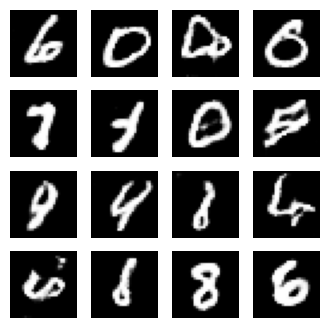

Epoch 196/200   Gen Loss: 0.8969   Disc Loss: 1.2676


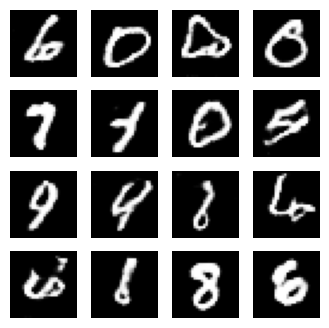

Epoch 197/200   Gen Loss: 0.7443   Disc Loss: 1.2953


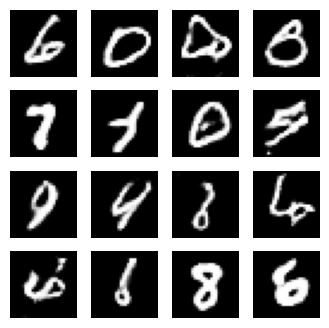

Epoch 198/200   Gen Loss: 0.7808   Disc Loss: 1.3875


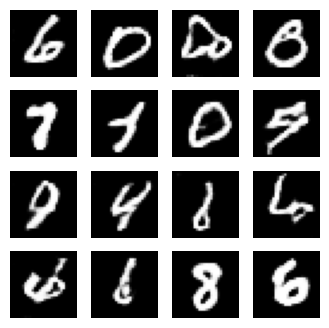

Epoch 199/200   Gen Loss: 0.7517   Disc Loss: 1.3319


In [ ]:
# Training Loop

def train(epochs=200):
    fixed_noise = tf.random.normal([16, 100])

    for epoch in range(epochs):
        for img_batch in dataset:
            gen_loss, disc_loss = train_step(img_batch)

        # Show sample results
        print(f"Epoch {epoch+1}/{epochs}   Gen Loss: {gen_loss:.4f}   Disc Loss: {disc_loss:.4f}")

        fake_imgs = generator(fixed_noise, training=False)
        fake_imgs = (fake_imgs + 1) / 2.0

        plt.figure(figsize=(4,4))
        for i in range(16):
            plt.subplot(4,4,i+1)
            plt.imshow(fake_imgs[i,:,:,0], cmap='gray')
            plt.axis('off')
        plt.show()

train(epochs=200)